# Exploratory Training Data Analysis
- Identifying features > 25% missing to remove
- Identifying extremely correlating features to remove
- Plotting distributions of features
- Plotting selected features by BorutaShap (correlation, covariance, distribution, mutual information, pairwise plots)
- Pairwise-dependence plots of selected features by BorutaShap and their feature-feature interactions.
- Visualization of unsupervised learning (training data groupings in hierarchical clustering and silhoutte plots)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.io as pio
from pdpbox import get_dataset, info_plots, pdp

%matplotlib inline
%config InlineBackend.figure_format ='retina'

pio.renderers.default = "notebook"
import plotly.figure_factory as ff
import plotly.offline as py

py.init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import missingno as msno
import numpy
import plotly.graph_objs as go
import plotly.tools as tls
import scipy.cluster.hierarchy as hcluster
import scipy.cluster.hierarchy as shc
from missingpy import MissForest
from plotnine import *
from scipy.cluster.hierarchy import dendrogram, ward
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use("ggplot")
import seaborn as sns
from matplotlib import pyplot
from pdpbox import get_dataset, info_plots, pdp
from sklearn.ensemble import (
    BaggingRegressor,
    GradientBoostingRegressor,
    RandomForestRegressor,
    StackingRegressor,
    VotingRegressor,
)
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.model_selection import train_test_split

sns.set_style("darkgrid")
sns.mpl.rcParams["figure.figsize"] = (15.0, 9.0)

import re

from scipy.cluster.hierarchy import dendrogram, linkage

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import gc
import warnings

warnings.filterwarnings("ignore")

import xgboost
from sklearn.model_selection import train_test_split

seed = 0

In [2]:
dataset = pd.read_csv("training_data.txt", sep="\t")
dataset = dataset.rename({"IPA_BP": "IPA_BP_annotation"}, axis=1)
dataset.shape

(293, 119)

In [3]:
data = dataset.drop(["Gene"], 1)
print(data.shape)

(293, 118)


In [4]:
data["BPlabel_encoded"] = data["BPlabel"].map(
    {"most likely": 1, "probable": 0.75, "least likely": 0.1}
)
Y = data["BPlabel_encoded"]

In [5]:
data.describe()

,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,Adipose - Subcutaneous_GTExTPM,Adipose - Visceral (Omentum)_GTExTPM,Adrenal Gland_GTExTPM,...,M-CAP_rankscore,MetaLR_rankscore,MetaSVM_rankscore,MutationAssessor_rankscore,REVEL_score,fathmm-MKL_coding_score,integrated_fitCons_rankscore,LoFtool,GERP_Rankscore,BPlabel_encoded
count,79.000000,71.000000,71.000000,0.0,293.000000,277.000000,202.000000,250.000000,250.000000,250.000000,...,77.000000,77.000000,77.000000,73.000000,77.000000,78.000000,78.000000,188.000000,78.000000,293.000000
mean,0.151481,0.409563,0.161437,NaN,233.358362,0.006667,82.289822,49.424806,44.436780,93.128354,...,0.612456,0.597400,0.598472,0.596676,0.428506,0.787086,0.606648,0.527368,0.603833,0.587201
std,0.138249,0.233443,0.287332,NaN,494.452338,0.423652,278.525886,189.731966,170.059814,587.571596,...,0.296804,0.299196,0.299483,0.302746,0.321888,0.330781,0.297960,0.303226,0.285745,0.344797
min,0.011000,0.043000,0.000000,NaN,1.000000,-0.832600,5.096910,0.000000,0.000000,0.000000,...,0.032450,0.013650,0.008420,0.007490,0.008000,0.002500,0.058000,0.000207,0.009610,0.100000
25%,0.046000,0.289000,0.000000,NaN,31.000000,-0.371900,11.774227,0.123009,0.105409,0.148155,...,0.421660,0.304600,0.387420,0.349340,0.137000,0.768550,0.328007,0.275250,0.410828,0.100000
50%,0.104000,0.402000,0.001000,NaN,74.000000,-0.134500,22.650515,5.033580,5.206535,2.843980,...,0.625170,0.642350,0.632820,0.657030,0.354000,0.955765,0.731370,0.563500,0.671540,0.750000
75%,0.226500,0.477500,0.143000,NaN,244.000000,0.377600,49.091129,26.559550,24.756600,18.748175,...,0.890120,0.868700,0.855770,0.889720,0.735000,0.988328,0.867870,0.782250,0.839353,0.750000
max,0.657000,0.958000,0.953000,NaN,6437.000000,1.255900,3228.698970,2239.420000,1987.060000,6921.500000,...,0.996500,0.999930,0.999910,0.996390,0.978000,0.998400,0.996250,1.000000,0.993020,1.000000


### Plotting Data Missingness:

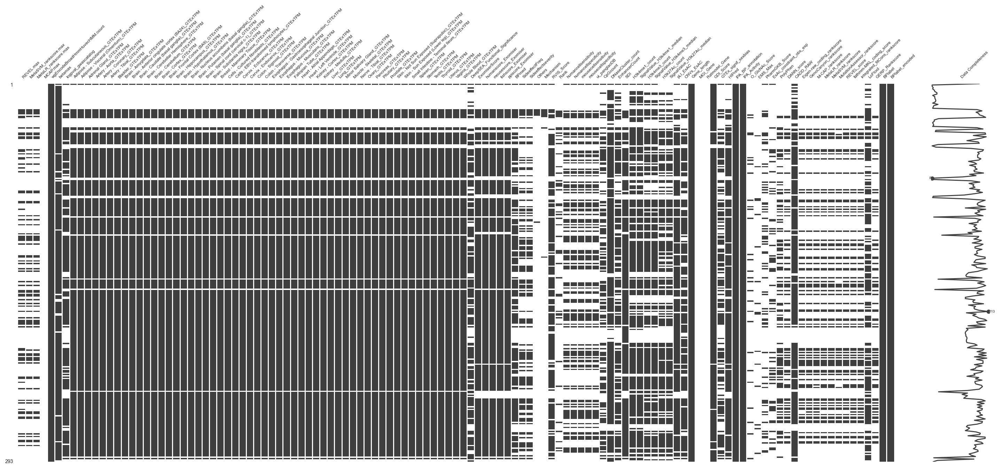

In [6]:
msno.matrix(data, labels=True, fontsize=6)

In [7]:
plt.rcParams["legend.title_fontsize"] = "large"
fig = msno.heatmap(data, figsize=(75, 75))
fig_copy = fig.get_figure()
fig_copy.savefig("missing_corr.png", format="png", dpi=300, bbox_inches="tight")

In [8]:
data.isnull().sum()

REVEL.max                         214
MetaSVM_rankscore.max             222
MetaLR_rankscore.max              222
MCAP.max                          293
wgEncodeBroadHmmHuvecHMM.count      0
                                 ... 
integrated_fitCons_rankscore      215
LoFtool                           105
GERP_Rankscore                    215
BPlabel                             0
BPlabel_encoded                     0
Length: 119, dtype: int64

In [9]:
natest = data.isnull().sum()
natest.sort_values(inplace=True)

In [10]:
percent_missing = data.isnull().sum() * 100 / len(data)
missing_value_df = pd.DataFrame(
    {"column_name": data.columns, "percent_missing": percent_missing}
)
missing_value_df.sort_values("percent_missing", inplace=True)

In [11]:
natest = natest.to_frame()
missingdata = natest.join(missing_value_df)

In [12]:
missingdata.to_csv("traininggenes_features_with_NA.csv")

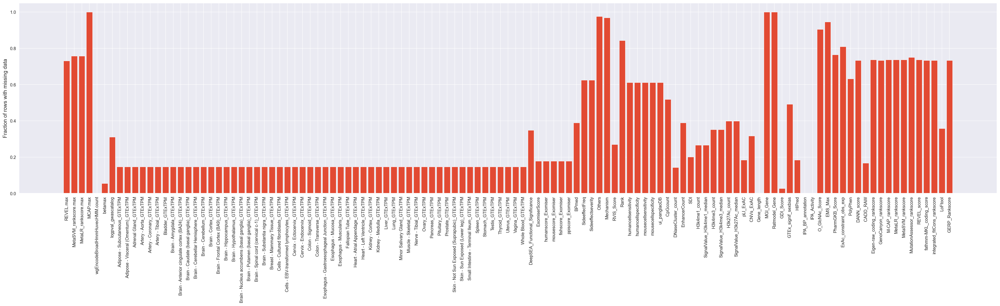

In [13]:
data_drop = data.drop(["BPlabel", "BPlabel_encoded",], 1)

null_counts = data_drop.isnull().sum() / len(data_drop)
plt.figure(figsize=(40, 8))
plt.xticks(np.arange(len(null_counts)) + 0.0, null_counts.index, rotation="vertical")
plt.ylabel("Fraction of rows with missing data")
plt.bar(np.arange(len(null_counts)), null_counts)
plt.savefig("missingness.png", format="png", dpi=300, bbox_inches="tight")

In [14]:
selection = missing_value_df[missing_value_df["percent_missing"] < 25.00]
list(selection["column_name"])

['BPlabel_encoded',
 'Gene_length',
 'wgEncodeBroadHmmHuvecHMM.count',
 'BPlabel',
 'IPA_BP_annotation',
 'IPA_Activity',
 'GDI_Score',
 'betamax',
 'DNaseCluster_count',
 'Fallopian Tube_GTExTPM',
 'Nerve - Tibial_GTExTPM',
 'Heart - Atrial Appendage_GTExTPM',
 'Heart - Left Ventricle_GTExTPM',
 'Kidney - Cortex_GTExTPM',
 'Kidney - Medulla_GTExTPM',
 'Liver_GTExTPM',
 'Lung_GTExTPM',
 'Minor Salivary Gland_GTExTPM',
 'Muscle - Skeletal_GTExTPM',
 'Ovary_GTExTPM',
 'Skin - Sun Exposed (Lower leg)_GTExTPM',
 'Pituitary_GTExTPM',
 'Prostate_GTExTPM',
 'Skin - Not Sun Exposed (Suprapubic)_GTExTPM',
 'Esophagus - Muscularis_GTExTPM',
 'Small Intestine - Terminal Ileum_GTExTPM',
 'Spleen_GTExTPM',
 'Stomach_GTExTPM',
 'Testis_GTExTPM',
 'Thyroid_GTExTPM',
 'Uterus_GTExTPM',
 'Whole Blood_GTExTPM',
 'Pancreas_GTExTPM',
 'Esophagus - Mucosa_GTExTPM',
 'Vagina_GTExTPM',
 'Colon - Transverse_GTExTPM',
 'Adipose - Subcutaneous_GTExTPM',
 'Esophagus - Gastroesophageal Junction_GTExTPM',
 'Adrena

## Feature Correlation:

In [15]:
dat = data[list(selection["column_name"])]
dat["Gene"] = dataset["Gene"]

dt2 = dat
dat = dat.set_index("Gene")

df = dt2
df = df.set_index("Gene")
df["BPlabel_encoded"] = df["BPlabel"].map(
    {"most likely": 1, "probable": 0.75, "least likely": 0.1}
)

# removing remaining variant-level features strongly correlating with gene length:
df = df.drop(
    [
        "BPlabel",
        "Gene_length",
        "CADD_RAW",
        "gwastrait",
        "HIPred",
        "ppiscore_Exomiser",
        "DNaseCluster_count",
        "H3k4me1_count",
        "CpGcount",
        "EnhancerCount",
        "H3k4me3_count",
        "H3k27Ac_count",
    ],
    1,
    errors="ignore",
)
df.shape

(293, 66)

In [16]:
X = MinMaxScaler().fit_transform(df)
imputer = MissForest(random_state=seed)
X = pd.DataFrame(imputer.fit_transform(X), index=df.index, columns=df.columns)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5


BPlabel_encoded        1.000000
BPmed                  0.815985
HIPred                 0.549953
ExomiserScore          0.467829
IPA_BP_annotation      0.434867
                         ...   
MCAP.max                    NaN
fishscore_Exomiser          NaN
MGI_Gene                    NaN
Ratmodel_Gene               NaN
GTEx_signif_sexbias         NaN
Name: BPlabel_encoded, Length: 118, dtype: float64


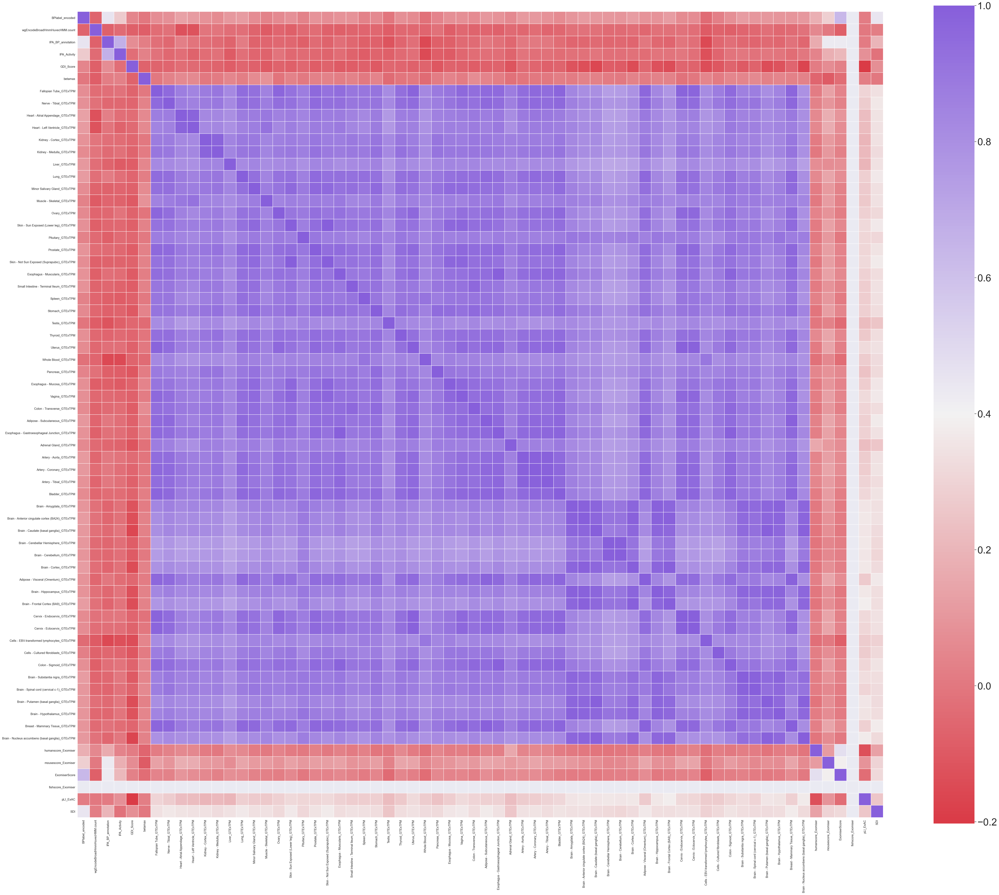

In [17]:
Xcor = X

Xcor = pd.DataFrame(data=Xcor, columns=X.columns)

corr = Xcor.corr(method="spearman")

f, ax = plt.subplots(figsize=(60, 50))

cmap = sns.diverging_palette(10, 275, as_cmap=True)
sns.set(font_scale=3)

htmap = sns.heatmap(
    corr,
    cmap=cmap,
    square=True,
    xticklabels=True,
    yticklabels=True,
    linewidths=0.5,
    ax=ax,
)

figure = htmap.get_figure()
figure.savefig("correlation_heatmap.png", format="png", dpi=300, bbox_inches="tight")

corr_matrix = data.corr()
print(corr_matrix["BPlabel_encoded"].sort_values(ascending=False))
corr = corr_matrix["BPlabel_encoded"].sort_values(ascending=False)

In [18]:
def corrFilter(x: pd.DataFrame, bound: float):
    xCorr = x.corr()
    xFiltered = xCorr[((xCorr >= bound) | (xCorr <= -bound)) & (xCorr != 1.000)]
    xFlattened = xFiltered.unstack().sort_values().drop_duplicates()
    return xFlattened


corrFilter(X, 0.9)

pairs = corrFilter(X, 0.9)
pairs.to_csv("corr_pairs09.csv", header=True)

In [19]:
corr_matrix.to_csv("corr_matrix.csv", header=True)

In [20]:
corr.to_csv("training_correlation.csv", header=True)

In [21]:
corr = X.corr()
corr.head()

,BPlabel_encoded,wgEncodeBroadHmmHuvecHMM.count,IPA_BP_annotation,IPA_Activity,GDI_Score,betamax,Fallopian Tube_GTExTPM,Nerve - Tibial_GTExTPM,Heart - Atrial Appendage_GTExTPM,Heart - Left Ventricle_GTExTPM,...,Brain - Putamen (basal ganglia)_GTExTPM,Brain - Hypothalamus_GTExTPM,Breast - Mammary Tissue_GTExTPM,Brain - Nucleus accumbens (basal ganglia)_GTExTPM,humanscore_Exomiser,mousescore_Exomiser,ExomiserScore,fishscore_Exomiser,pLI_ExAC,SDI
BPlabel_encoded,1.000000,0.021060,0.434867,0.250701,-0.016510,-0.007778,0.064638,0.086373,0.069657,0.020952,...,0.100259,0.108683,0.089329,0.106943,0.212809,0.410135,0.556085,NaN,0.247206,0.382723
wgEncodeBroadHmmHuvecHMM.count,0.021060,1.000000,-0.057963,-0.029179,0.119810,0.026946,-0.028610,0.012153,-0.036193,-0.024883,...,0.012042,0.040488,-0.034362,0.010430,0.026692,-0.067883,-0.015191,NaN,0.055613,0.078769
IPA_BP_annotation,0.434867,-0.057963,1.000000,0.630778,0.011514,0.034662,0.085689,0.049514,0.114965,-0.036765,...,0.081700,0.079103,0.052105,0.074858,0.165629,0.555781,0.374279,NaN,0.056498,0.173301
IPA_Activity,0.250701,-0.029179,0.630778,1.000000,0.014027,0.037420,0.092588,0.043698,-0.013401,-0.029138,...,0.093933,0.156680,0.042793,0.096553,0.050757,0.191577,0.147951,NaN,0.094265,-0.018901
GDI_Score,-0.016510,0.119810,0.011514,0.014027,1.000000,-0.033972,0.151666,0.239910,0.039510,0.023899,...,0.063616,0.105658,0.315204,0.049920,0.032298,-0.012014,-0.027256,NaN,-0.034200,0.106463


In [22]:
Xcor = X
Xcor = pd.DataFrame(data=Xcor, columns=X.columns)
corr = Xcor.corr(method="spearman").abs()
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print("Dropped features with > 0.9 correlation:", to_drop)

Dropped features with > 0.9 correlation: ['Nerve - Tibial_GTExTPM', 'Heart - Left Ventricle_GTExTPM', 'Kidney - Medulla_GTExTPM', 'Lung_GTExTPM', 'Minor Salivary Gland_GTExTPM', 'Muscle - Skeletal_GTExTPM', 'Ovary_GTExTPM', 'Skin - Sun Exposed (Lower leg)_GTExTPM', 'Prostate_GTExTPM', 'Skin - Not Sun Exposed (Suprapubic)_GTExTPM', 'Esophagus - Muscularis_GTExTPM', 'Small Intestine - Terminal Ileum_GTExTPM', 'Spleen_GTExTPM', 'Stomach_GTExTPM', 'Thyroid_GTExTPM', 'Uterus_GTExTPM', 'Whole Blood_GTExTPM', 'Pancreas_GTExTPM', 'Esophagus - Mucosa_GTExTPM', 'Vagina_GTExTPM', 'Colon - Transverse_GTExTPM', 'Adipose - Subcutaneous_GTExTPM', 'Esophagus - Gastroesophageal Junction_GTExTPM', 'Artery - Aorta_GTExTPM', 'Artery - Coronary_GTExTPM', 'Artery - Tibial_GTExTPM', 'Bladder_GTExTPM', 'Brain - Anterior cingulate cortex (BA24)_GTExTPM', 'Brain - Caudate (basal ganglia)_GTExTPM', 'Brain - Cerebellar Hemisphere_GTExTPM', 'Brain - Cerebellum_GTExTPM', 'Brain - Cortex_GTExTPM', 'Adipose - Viscera

In [23]:
selected_columns = X.drop(X[to_drop], axis=1)
list(selected_columns)

['BPlabel_encoded',
 'wgEncodeBroadHmmHuvecHMM.count',
 'IPA_BP_annotation',
 'IPA_Activity',
 'GDI_Score',
 'betamax',
 'Fallopian Tube_GTExTPM',
 'Heart - Atrial Appendage_GTExTPM',
 'Kidney - Cortex_GTExTPM',
 'Liver_GTExTPM',
 'Pituitary_GTExTPM',
 'Testis_GTExTPM',
 'Adrenal Gland_GTExTPM',
 'Brain - Amygdala_GTExTPM',
 'Cells - EBV-transformed lymphocytes_GTExTPM',
 'humanscore_Exomiser',
 'mousescore_Exomiser',
 'ExomiserScore',
 'fishscore_Exomiser',
 'pLI_ExAC',
 'SDI']

### Viewing genes >25% missing rowwise for selected features (after running BorutaShap)

In [24]:
dt = dat[
    [
        "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

In [25]:
dt["missing_count"] = dt.isnull().sum(axis=1)

dt["missing_percentage"] = (dt["missing_count"] / 19) * 100

dt.sort_values("missing_percentage", inplace=True)
print(dt[["missing_count", "missing_percentage"]])
# dt.shape

             missing_count  missing_percentage
Gene                                          
ABCC9                    0            0.000000
NPPA                     0            0.000000
NPPB                     0            0.000000
NPR1                     0            0.000000
NPR3                     0            0.000000
...                    ...                 ...
CTB-167G5.5              7           36.842105
AC111200.1               7           36.842105
AC108868.1               7           36.842105
AC093677.1               7           36.842105
ZSCAN5D                  7           36.842105

[293 rows x 2 columns]


In [26]:
dtmissing = dt.loc[dt["missing_percentage"] > 25]
dtmissing

,SDI,Liver_GTExTPM,Cells - EBV-transformed lymphocytes_GTExTPM,Pituitary_GTExTPM,pLI_ExAC,mousescore_Exomiser,HIPred,IPA_BP_annotation,missing_count,missing_percentage
Gene,,,,,,,,,,
AC022532.1,NaN,NaN,NaN,NaN,0.050466,NaN,0.146139,0,5,26.315789
AP000867.1,NaN,NaN,NaN,NaN,0.028983,NaN,0.179693,0,5,26.315789
RP11-108K14.8,NaN,NaN,NaN,NaN,0.029365,NaN,0.214145,0,5,26.315789
C1orf192,NaN,NaN,NaN,NaN,0.000005,NaN,0.177926,0,5,26.315789
AL445989.1,NaN,NaN,NaN,NaN,0.172746,NaN,0.237915,0,5,26.315789
AL031666.2,NaN,NaN,NaN,NaN,0.159468,NaN,0.146139,0,5,26.315789
AC068620.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,7,36.842105
AC020907.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,7,36.842105
AC018445.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,7,36.842105


### Gene length distribution:


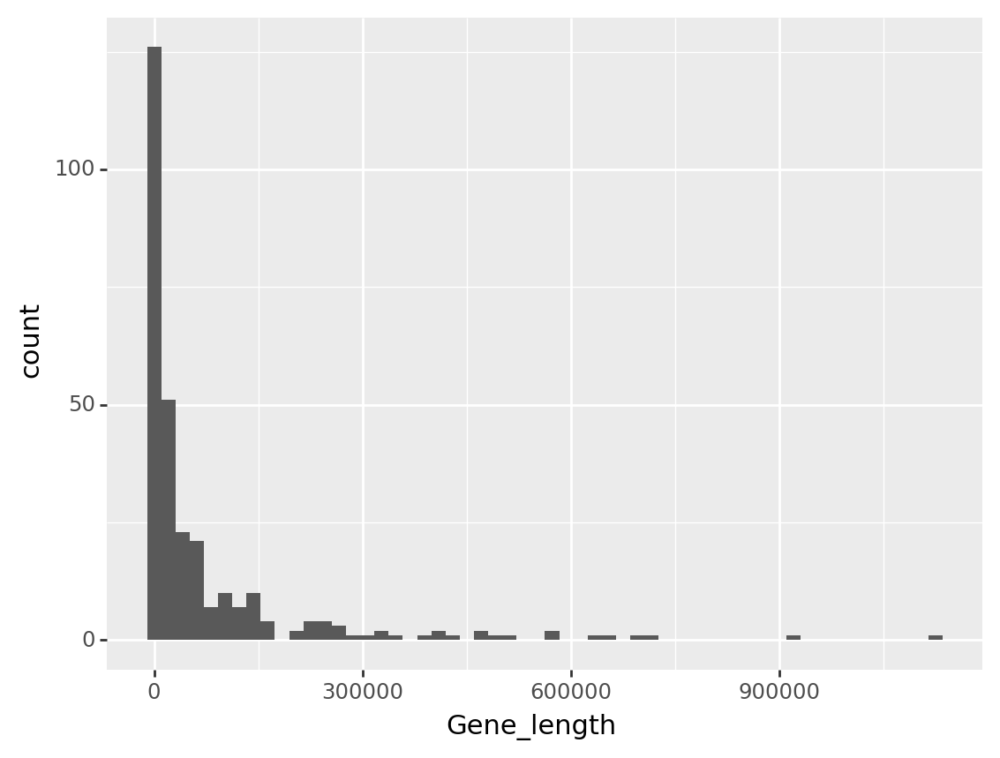

<ggplot: (8761348354109)>

In [27]:
(ggplot(dat, aes(x="Gene_length")) + geom_histogram())

In [28]:
dt_ml = data.loc[data["BPlabel_encoded"] == 1.0]

dt_ml = dt_ml[
    [
      "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]


dt_ll = data.loc[data["BPlabel_encoded"] == 0.1]

dt_ll = dt_ll[
    [
         "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

target_0 = data.loc[data["BPlabel_encoded"] == 0.1]
target_1 = data.loc[data["BPlabel_encoded"] == 1]
target_2 = data.loc[data["BPlabel_encoded"] == 0.75]
combo = pd.concat([target_0, target_1])
combo2 = pd.concat([target_0, target_1, target_2])

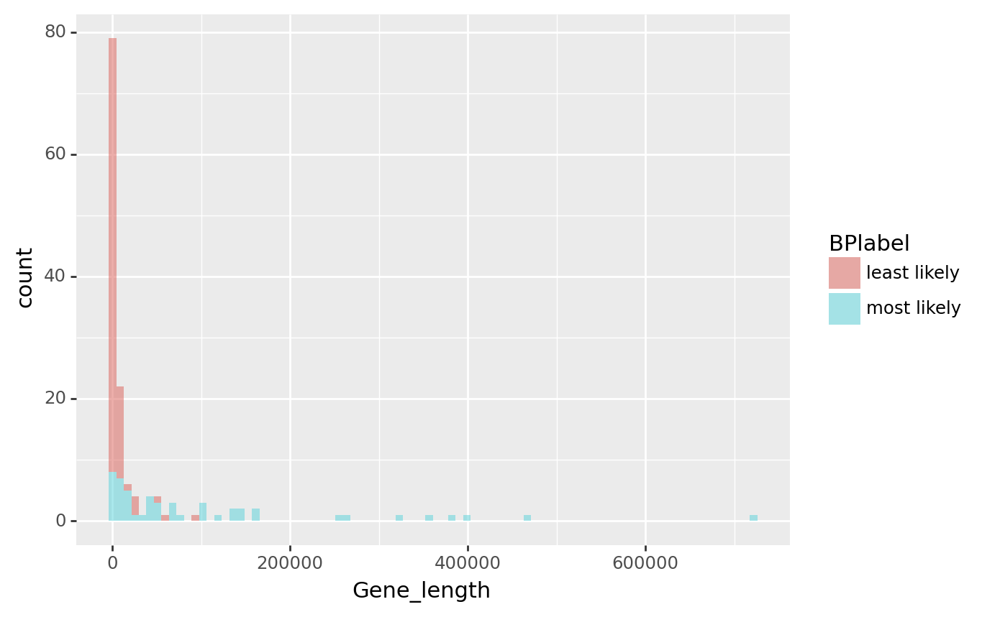

<ggplot: (8761281105785)>

In [29]:
(ggplot(combo, aes(x="Gene_length", fill="BPlabel")) + geom_histogram(alpha=0.5))

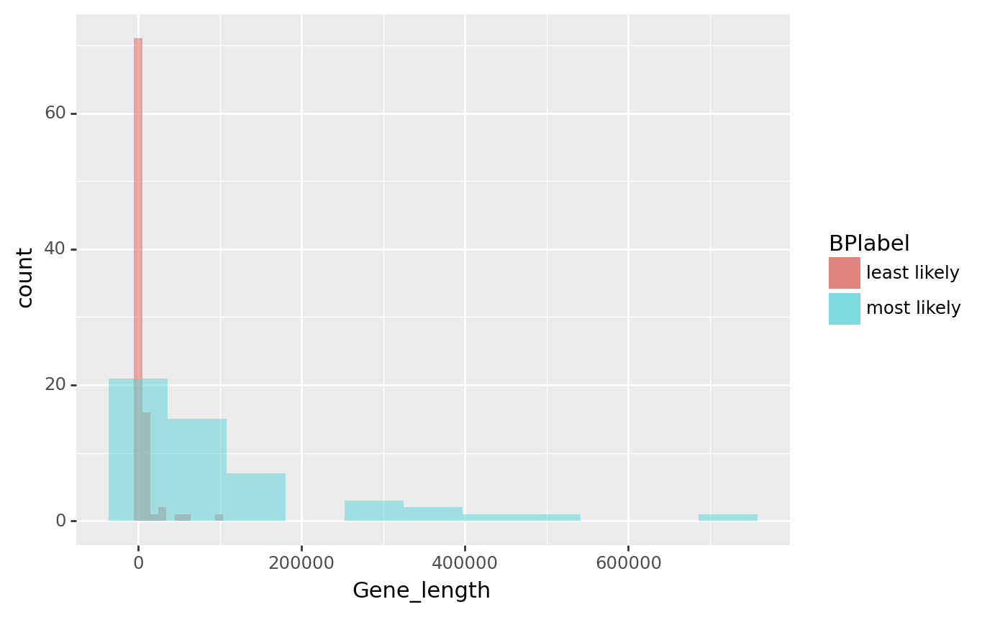

<ggplot: (8761348387139)>

In [30]:
(
    ggplot()
    + geom_histogram(target_0, aes(x="Gene_length", fill="BPlabel"), alpha=0.5)
    + geom_histogram(target_1, aes(x="Gene_length", fill="BPlabel"), alpha=0.5)
)

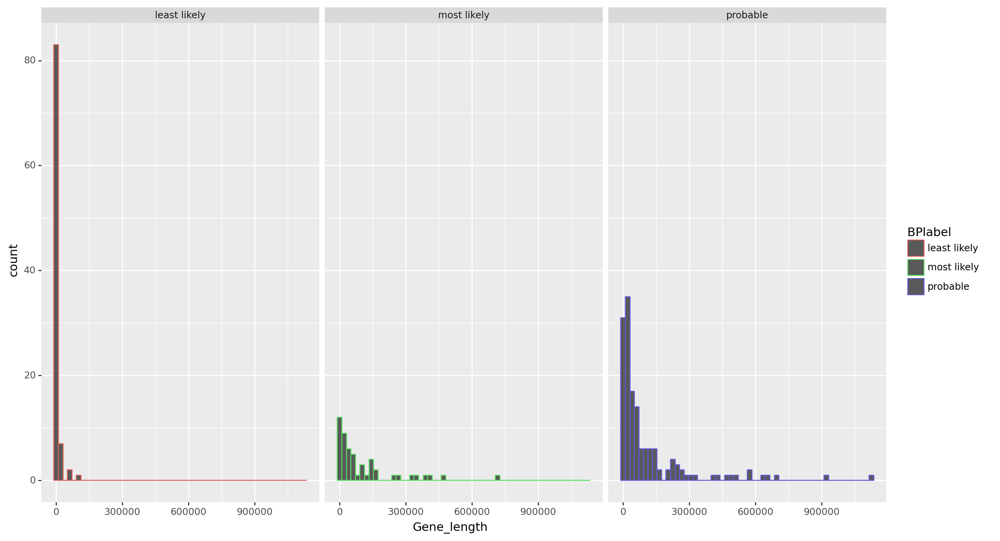

<ggplot: (8761263741814)>

In [31]:
ggplot(combo2, aes(x="Gene_length", color="BPlabel")) + geom_histogram() + facet_wrap(
    ["BPlabel"]
) + theme(figure_size=(14, 8))

### Feature distribution:

KeyError: 'HIPred'

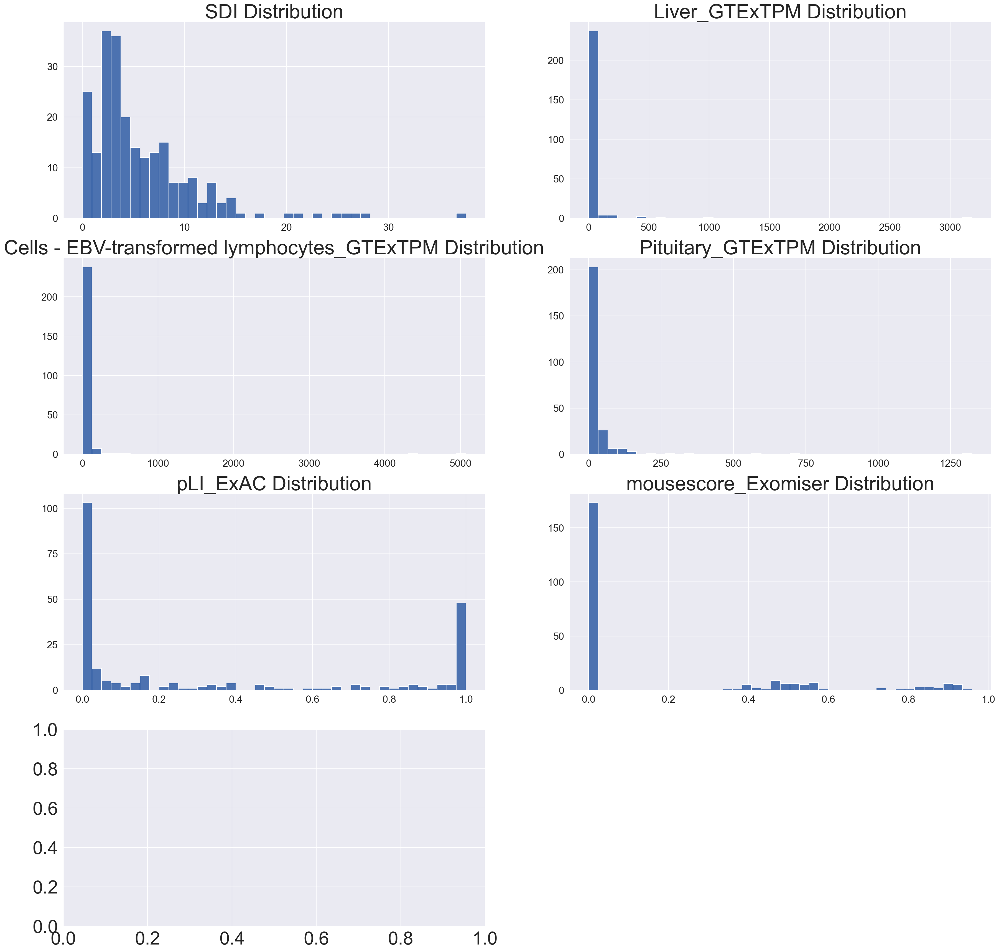

In [32]:
def draw_histograms(dataf, variables, n_rows, n_cols):
    fig = plt.figure()
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i + 1)
        df[var_name].hist(
            bins=40,
            linewidth=1.0,
            xlabelsize=18,
            ylabelsize=18,
            figsize=(30, 30),
            ax=ax,
        )
        ax.set_title(var_name + " Distribution")
    fig.tight_layout()
    plt.suptitle("Training Data Univariate Plots", y=1.02, fontsize=35)
    plt.savefig(
        "training_gene_feature_distribution.png",
        format="png",
        dpi=300,
        bbox_inches="tight",
    )
    plt.show()


test = pd.DataFrame(np.random.randn(30, 9), columns=map(str, range(9)))
draw_histograms(dt, dt.columns, 4, 2)

In [ ]:
# features only selected by BorutaShap:
sns.set(font_scale=2)
features_list = [
 "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
]


axarr = dt[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    stacked=True,
    figsize=(30, 25),
    color="cornflowerblue",
)

for ax in axarr.flatten():
    ax.set_ylabel("Count")

plt.tight_layout()
plt.grid(axis="x", color="0.95")
plt.suptitle("Trainign Data Univariate Plots", y=1.02, fontsize=35)

plt.savefig(
    "training_gene_feature_distribution.png", format="png", dpi=300, bbox_inches="tight"
)

In [ ]:
# most likely genes

dt_ml = data.loc[data["BPlabel_encoded"] == 1.0]

dt_ml = dt_ml[
    [
        "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

sns.set(font_scale=2)
features_list = list(dt_ml.columns)

dt_ml[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

In [ ]:
# probable genes

dt_p = data.loc[data["BPlabel_encoded"] == 0.75]

dt_p = dt_p[
    [
        "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]


sns.set(font_scale=2)
features_list = list(dt_p.columns)

dt_p[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

In [ ]:
# least likely genes
dt_ll = data.loc[data["BPlabel_encoded"] == 0.1]

dt_ll = dt_ll[
    [
       "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

sns.set(font_scale=2)
features_list = list(dt_ll.columns)

dt_ll[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()
ax.set_ylabel("Gene Count")

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

### Covariation Heatmaps:

In [ ]:
mean_vec = np.mean(Xcor, axis=0)
cov_mat = (Xcor - mean_vec).T.dot((Xcor - mean_vec)) / (Xcor.shape[0] - 1)
# print('Covariance matrix \n%s' %cov_mat)
sns.set(font_scale=1)
plt.figure(figsize=(20, 20))
sns.heatmap(cov_mat, vmax=1, square=True, cmap="cubehelix")

plt.title("Covariance between different features")

## Visualization of Selected Features
Features selected by BorutaShap

In [33]:
X2 = pd.read_csv("imputed_training_data.csv", header=0)
X2 = pd.concat([X2, Y], axis=1)

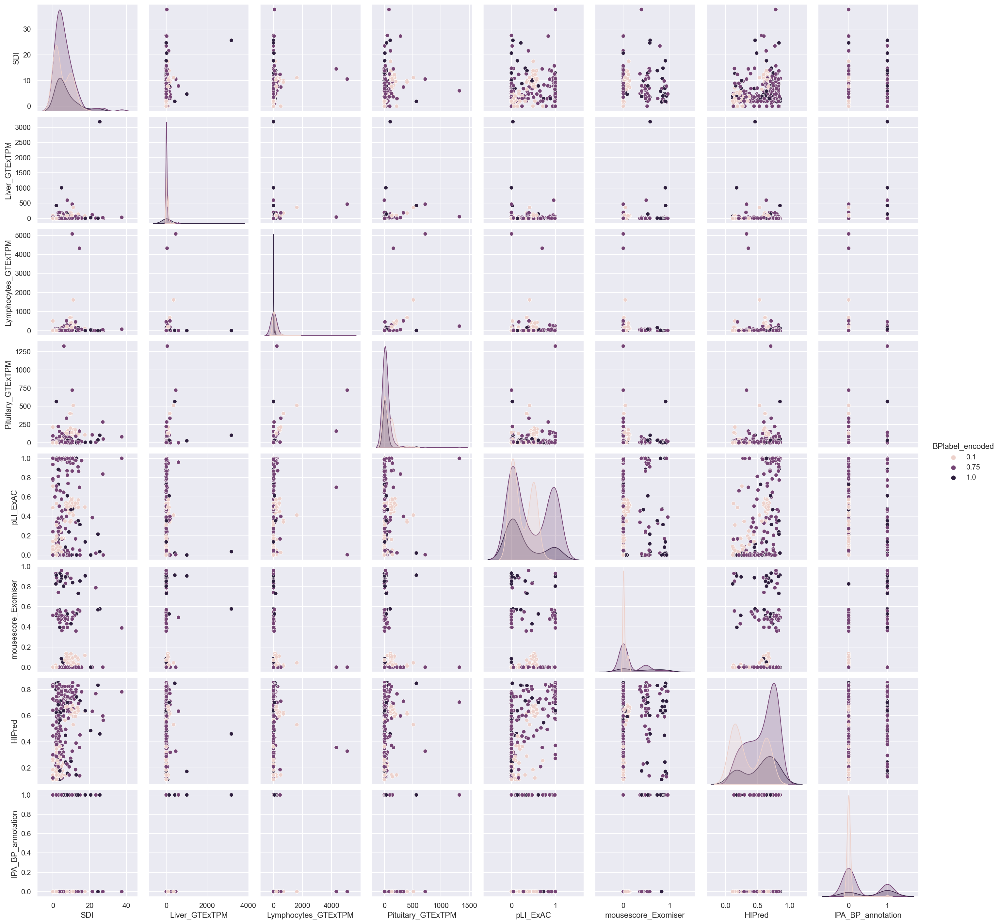

In [34]:
sns.set(font_scale=1)
Xplot = X2
Xplot = Xplot.rename({'Cells - EBV-transformed lymphocytes_GTExTPM':'Lymphocytes_GTExTPM'}, axis=1)
sns.pairplot(
    Xplot,
    hue="BPlabel_encoded",
    vars=[
        "SDI",
        "Liver_GTExTPM",
        "Lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ],
)

## Mutual Information of Selected Features
Mutual information (MI) between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

In [35]:
X2 = X2[
    [
        "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

## Comparison of F-test and mutual information
As F-test captures only linear dependency, it rates x_1 (HIPred) as the most discriminative feature. On the other hand, mutual information can capture any kind of dependency between variables and it rates x_4 (HIPred) as the most discriminative feature, which probably agrees better with our intuitive perception for this example. Both methods mark GTEx tissues (x_5 - x_7) as having the least relevance.

Mutual Information:
It measures the average reduction in uncertainty about x that results from learning the value of y; or vice versa, the average amount of information that x conveys about y — Page 139, Information Theory, Inference, and Learning Algorithms, 2003.


F-Test: calculates F-statistic and does a hypothesis testing model X and Y where X is a model created by just a constant and Y is the model created by a constant and a feature.

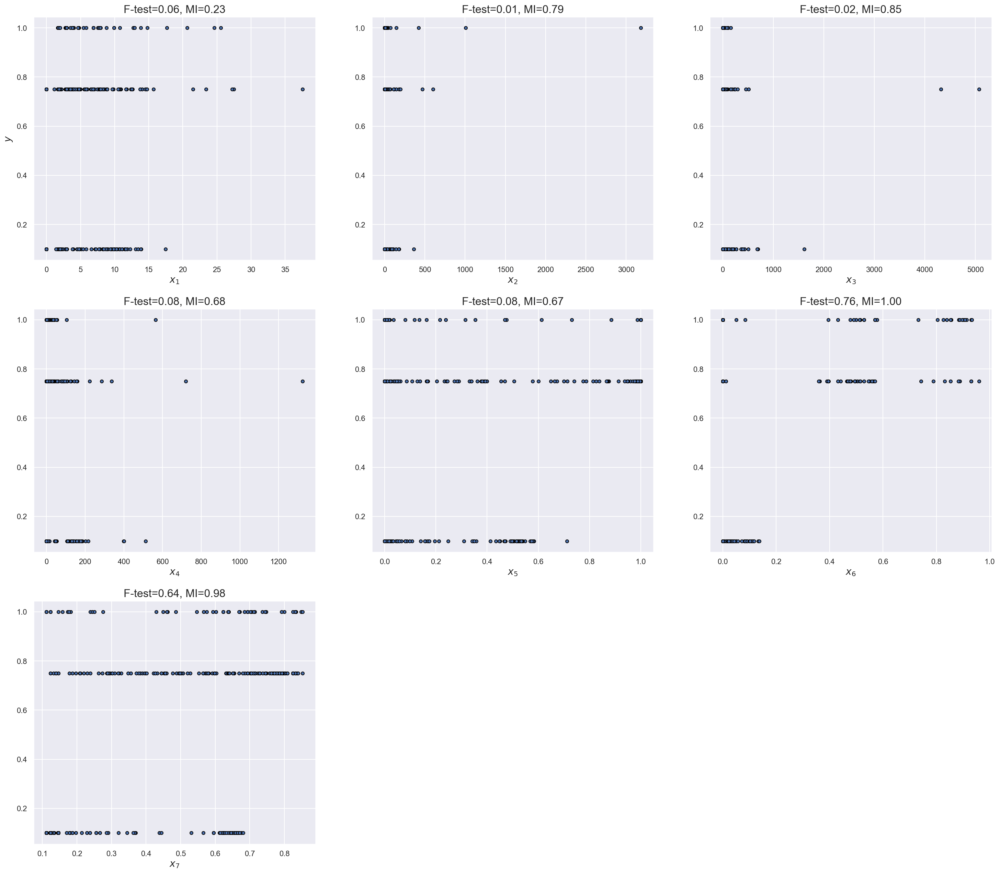

In [36]:
f_test, _ = f_regression(X2, Y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X2, Y)
mi /= np.max(mi)

plt.figure(figsize=(25, 30))
for i in range(7):
    plt.subplot(4, 3, i + 1)
    plt.scatter(X2.iloc[:, i], Y, edgecolor="black", s=20)
    plt.xlabel("$x_{}$".format(i + 1), fontsize=14)
    if i == 0:
        plt.ylabel("$y$", fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

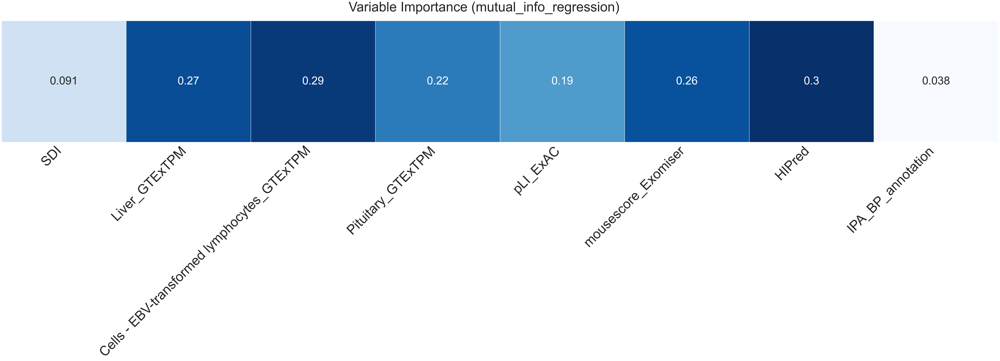

In [37]:
mutual_information = mutual_info_regression(X2, Y)

plt.subplots(1, figsize=(80, 10))
sns.heatmap(
    mutual_information[:, np.newaxis].T,
    cmap="Blues",
    cbar=False,
    linewidths=1,
    annot=True,
    annot_kws={"fontsize": 50},
)
plt.yticks([], [])
plt.gca().set_xticklabels(X2.columns, rotation=45, ha="right", fontsize=60)
plt.suptitle("Variable Importance (mutual_info_regression)", fontsize=60, y=1)
plt.gcf().subplots_adjust(wspace=0.2)
pass


plt.savefig("Mutual info gain.png", format="png", dpi=300, bbox_inches="tight")

### Selected Features Covariance and Correlation:

Text(0.5, 1.0, 'Covariance between different features')

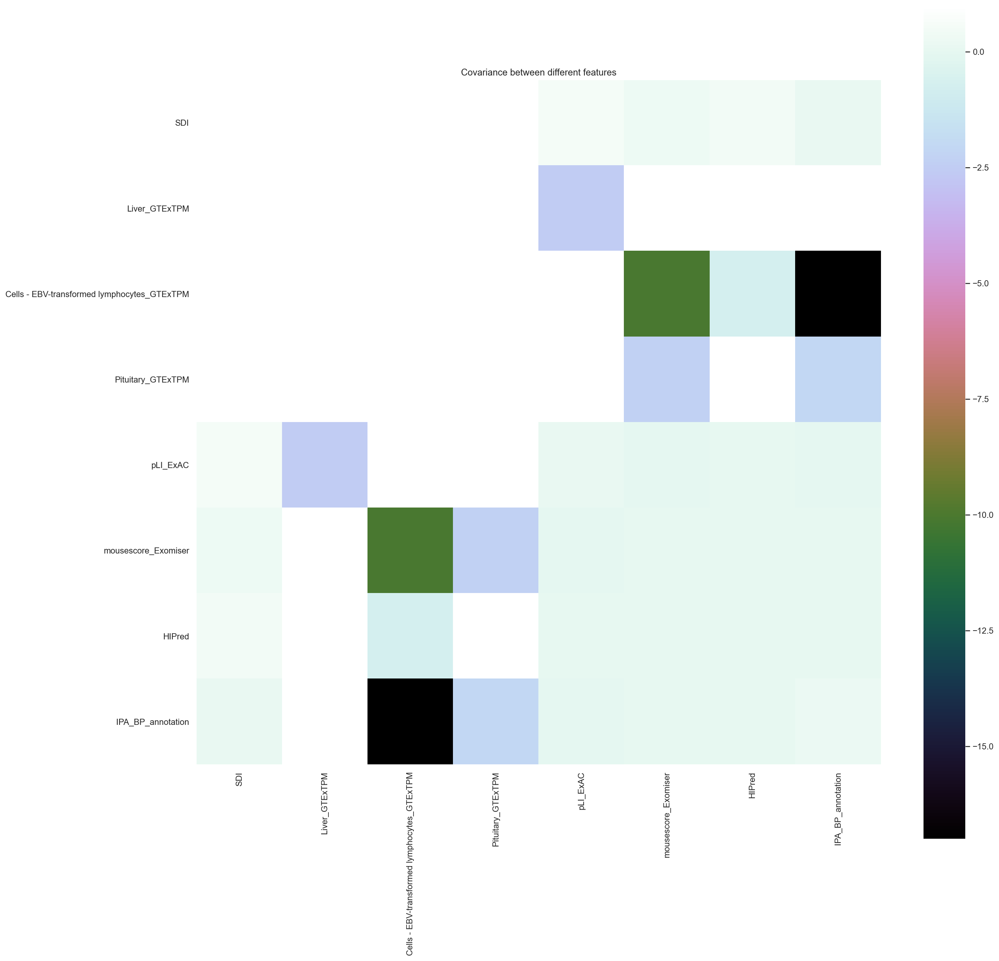

In [38]:
mean_vec = np.mean(X2, axis=0)
cov_mat = (X2 - mean_vec).T.dot((X2 - mean_vec)) / (X2.shape[0] - 1)
# print('Covariance matrix \n%s' %cov_mat)
sns.set(font_scale=1)
plt.figure(figsize=(20, 20))
sns.heatmap(cov_mat, vmax=1, square=True, cmap="cubehelix")

plt.title("Covariance between different features")

BPlabel_encoded        1.000000
BPmed                  0.815985
HIPred                 0.549953
ExomiserScore          0.467829
IPA_BP_annotation      0.434867
                         ...   
MCAP.max                    NaN
fishscore_Exomiser          NaN
MGI_Gene                    NaN
Ratmodel_Gene               NaN
GTEx_signif_sexbias         NaN
Name: BPlabel_encoded, Length: 118, dtype: float64


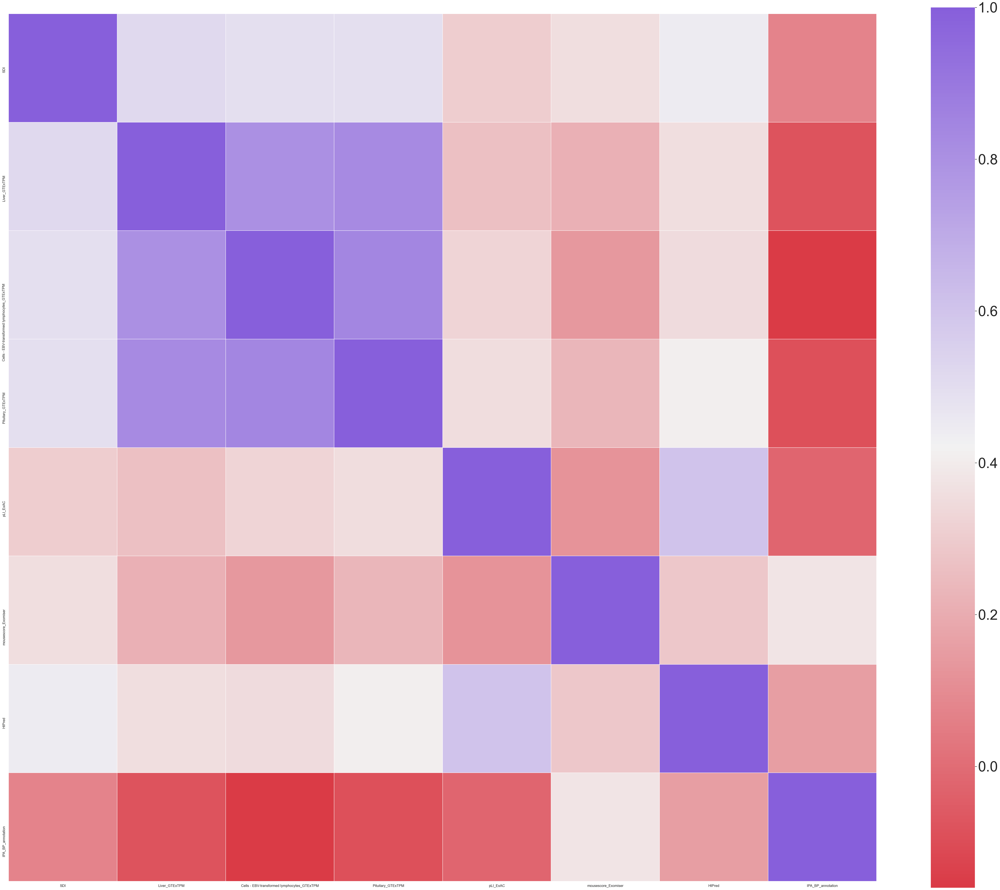

In [39]:
Xcor = X2
# Xcor.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in df1.columns.values]
Xcor = pd.DataFrame(data=Xcor, columns=X2.columns)
# Xcor.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

corr = Xcor.corr(method="spearman")

f, ax = plt.subplots(figsize=(60, 50))

# heatmap colours
cmap = sns.diverging_palette(10, 275, as_cmap=True)
sns.set(font_scale=4)
# heatmap plot of feature correlation
htmap = sns.heatmap(
    corr,
    cmap=cmap,
    square=True,
    xticklabels=True,
    yticklabels=True,
    linewidths=0.5,
    annot_kws={"size": 16},
    ax=ax,
)  

figure = htmap.get_figure()
figure.savefig("selected_correlation.png", format="png", dpi=300, bbox_inches="tight")


corr_matrix = data.corr()
print(corr_matrix["BPlabel_encoded"].sort_values(ascending=False))
corr = corr_matrix["BPlabel_encoded"].sort_values(ascending=False)

### Partial Dependence Plots

The y axis is interpreted as change in the prediction from what it would be predicted at the baseline or leftmost value.
A blue shaded area indicates level of confidence

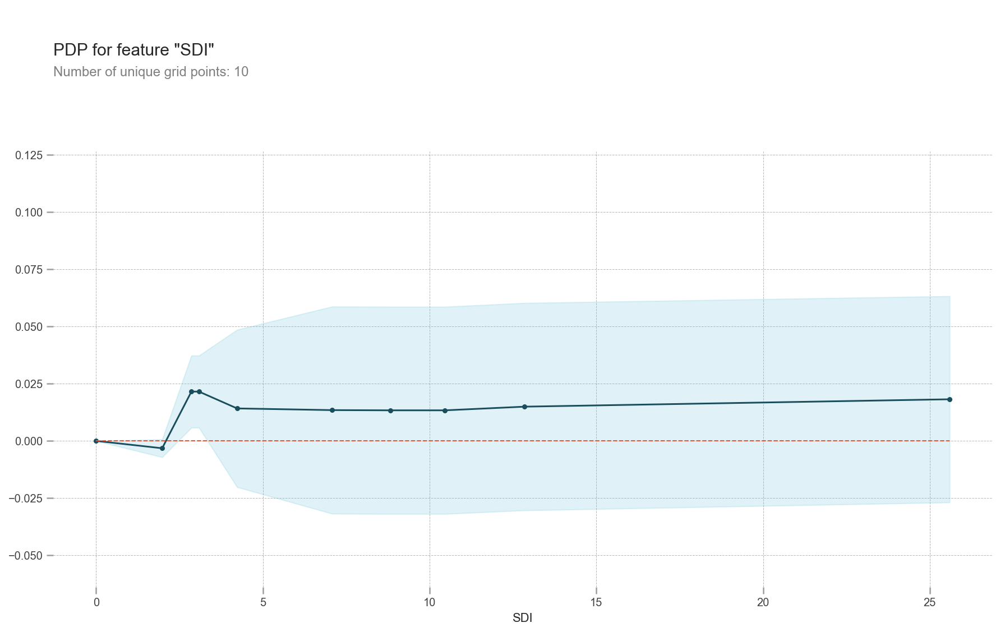

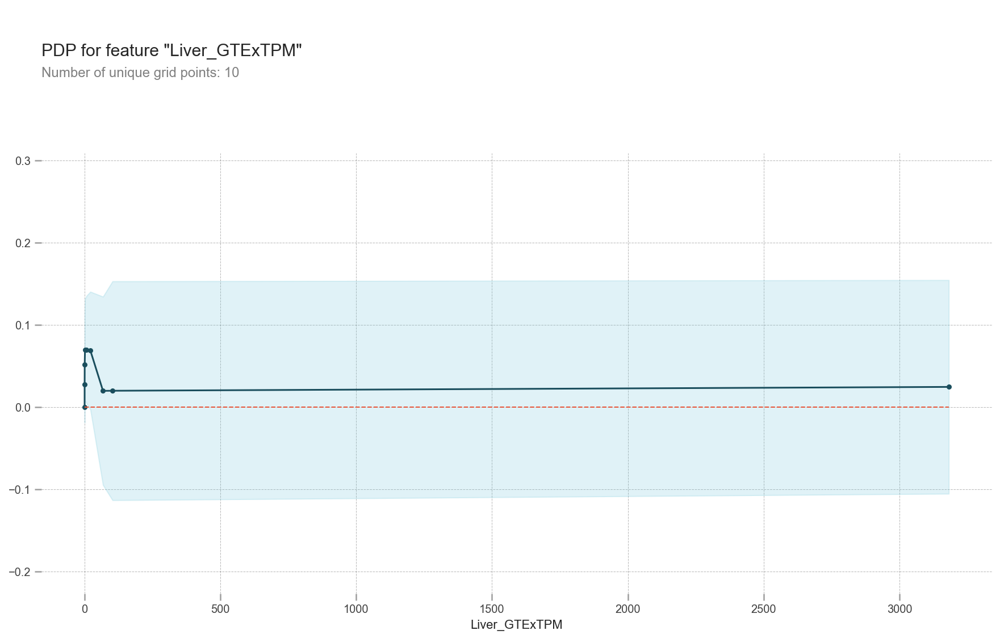

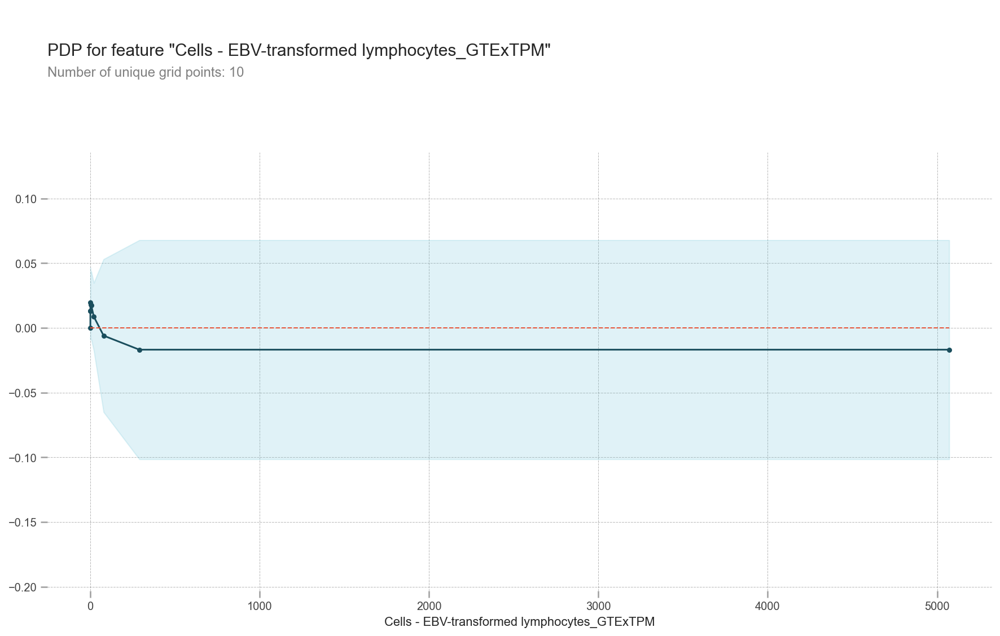

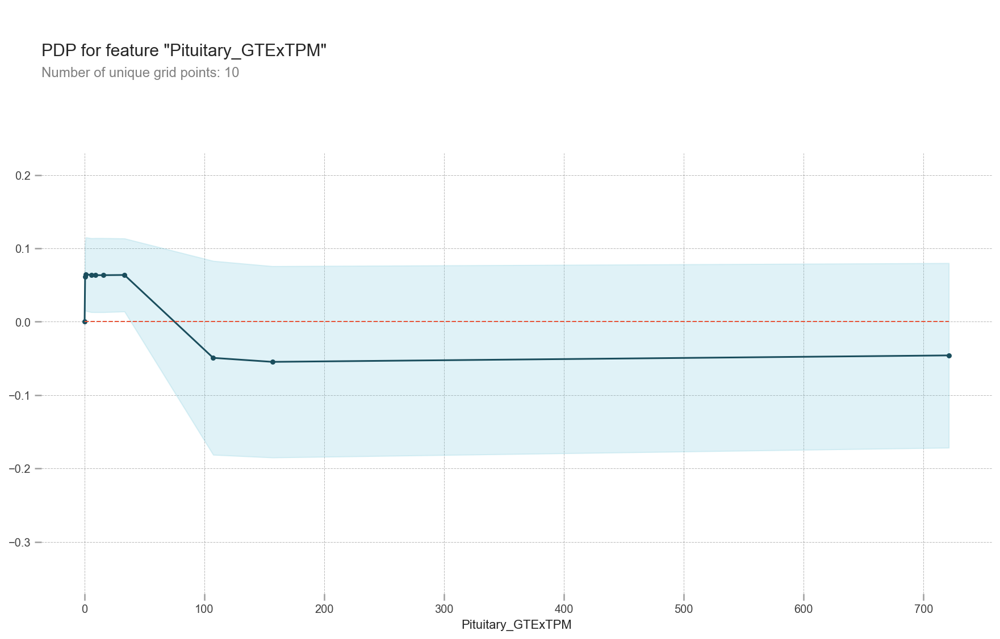

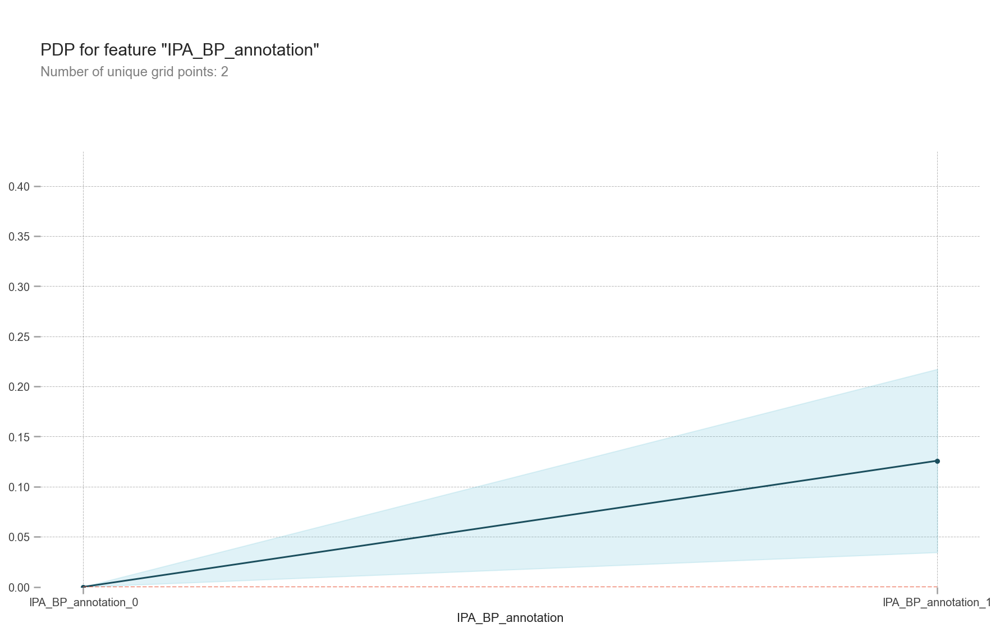

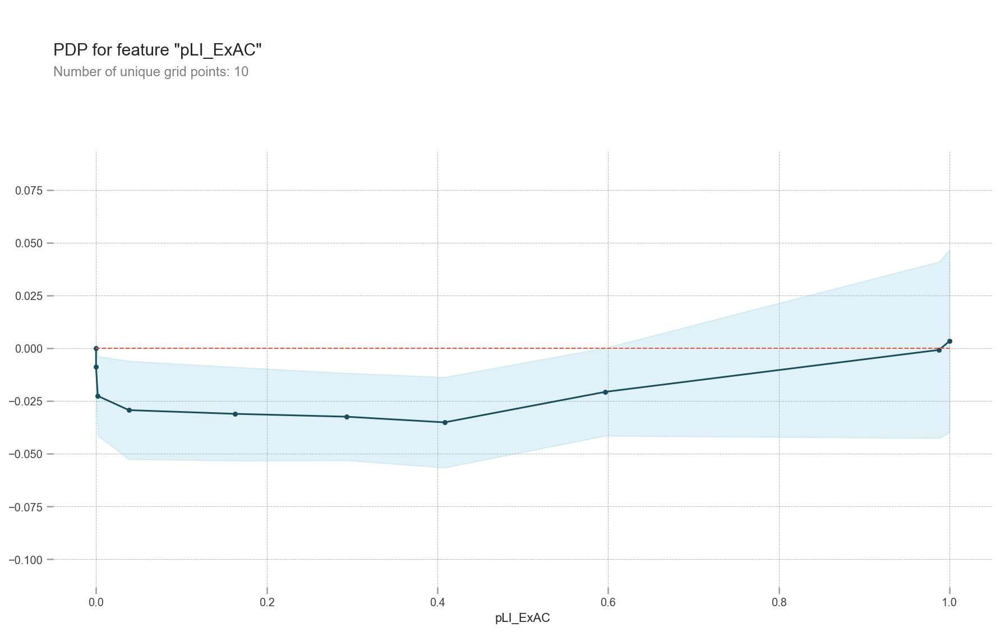

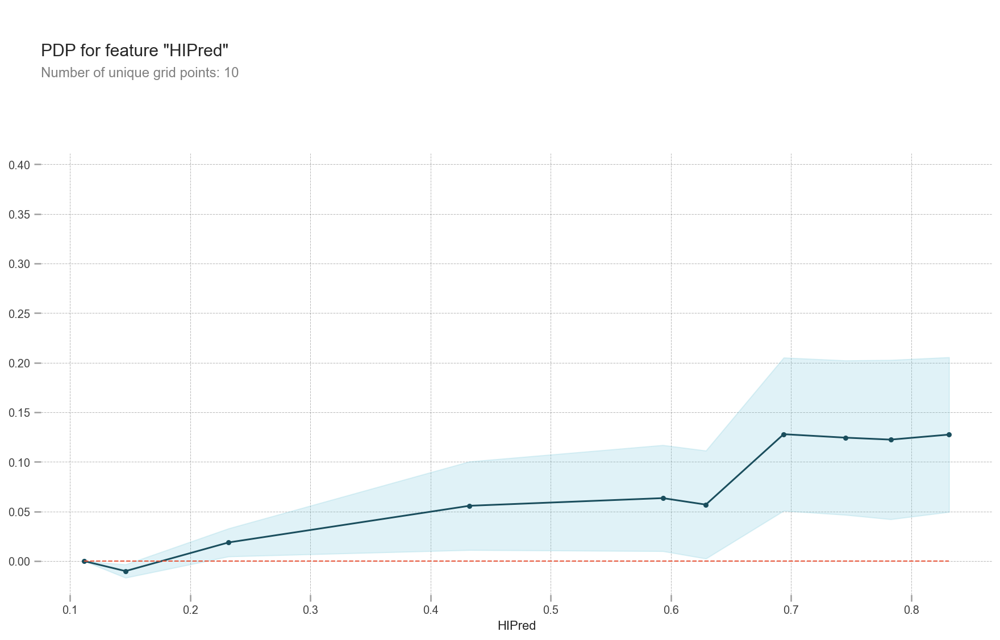

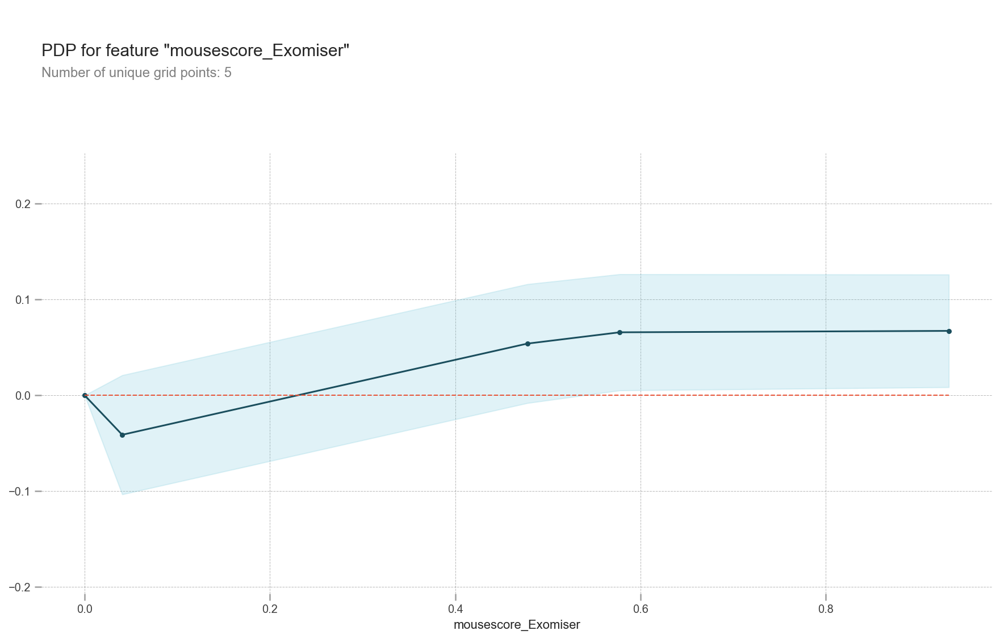

In [40]:
seed = 0
train_X, val_X, train_y, val_y = train_test_split(X2, Y, random_state=1)
tree_model = RandomForestRegressor(
    random_state=seed,
    criterion="mse",
    max_depth=4,
    max_features="sqrt",
    n_estimators=50,
).fit(train_X, train_y)

feature_to_plot = "SDI"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "Liver_GTExTPM"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "Cells - EBV-transformed lymphocytes_GTExTPM"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "Pituitary_GTExTPM"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "IPA_BP_annotation"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)
pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "pLI_ExAC"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)
pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "HIPred"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)
pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()


feature_to_plot = "mousescore_Exomiser"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

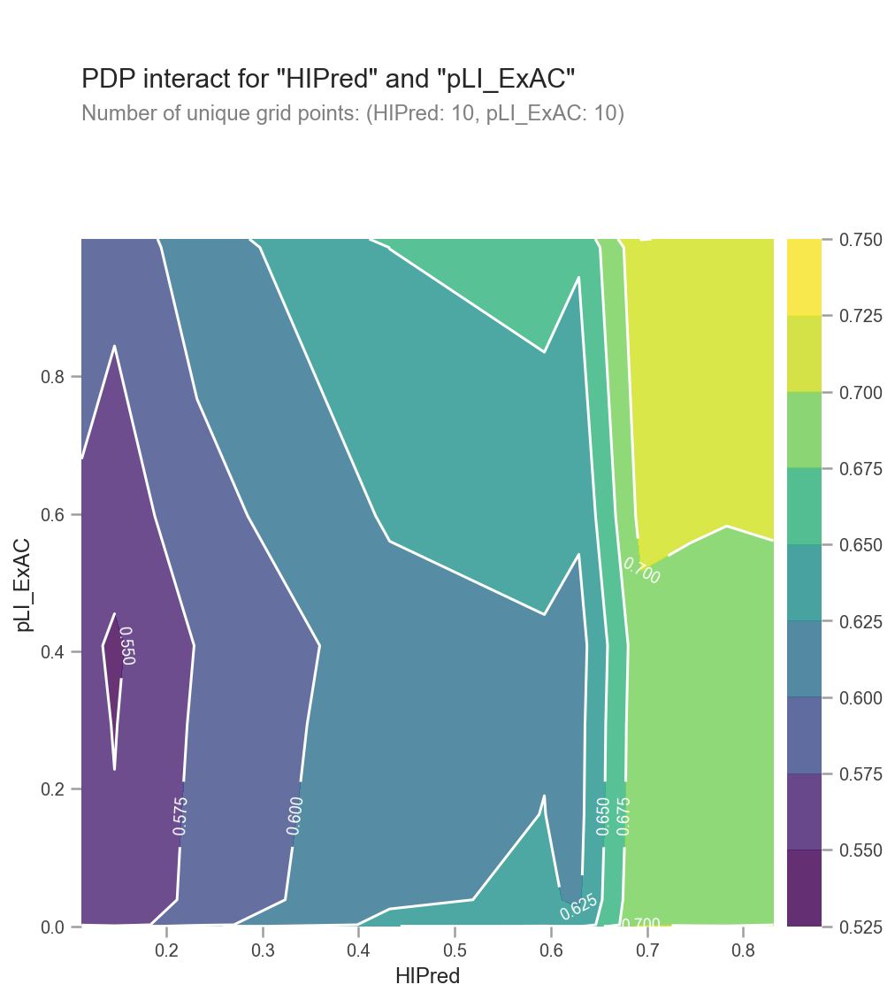

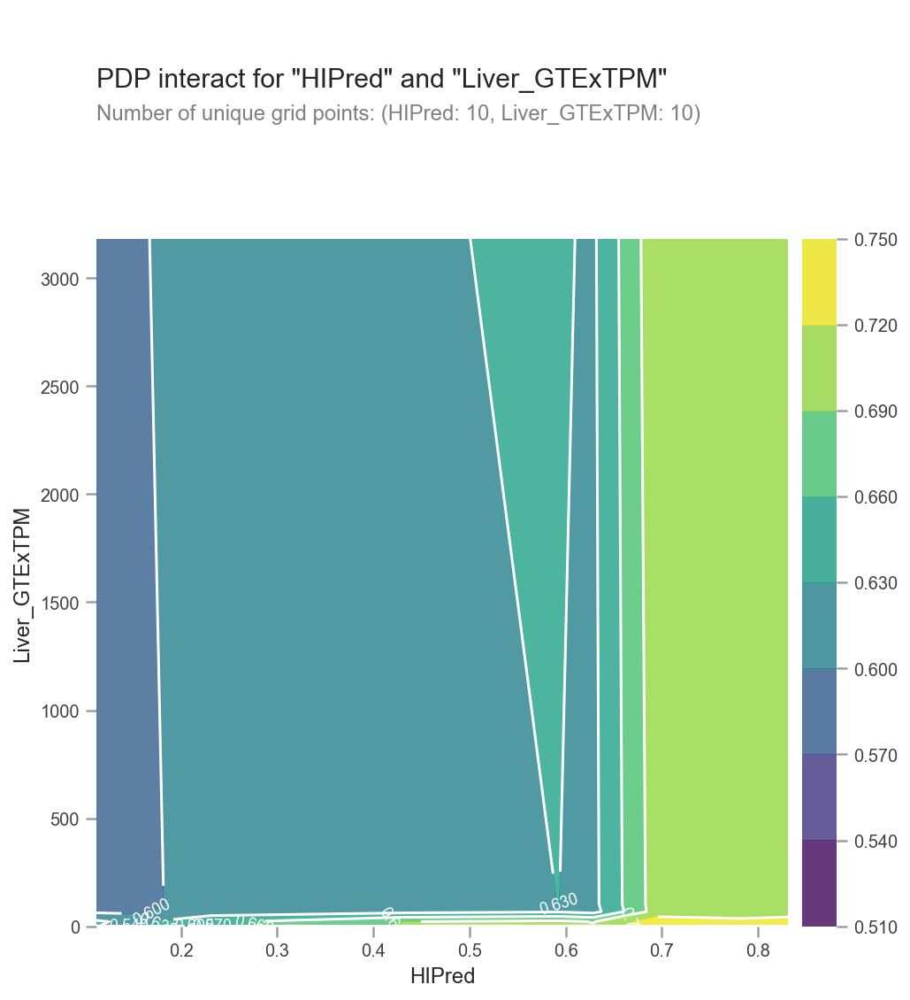

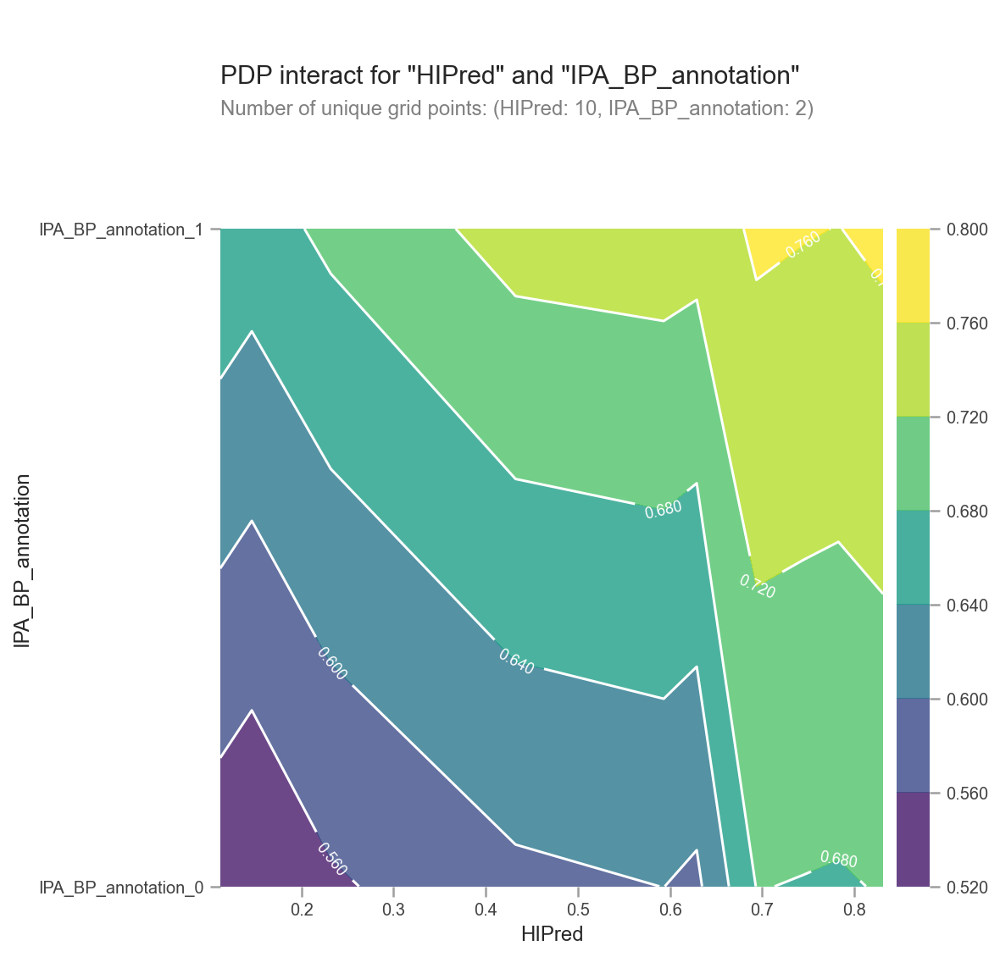

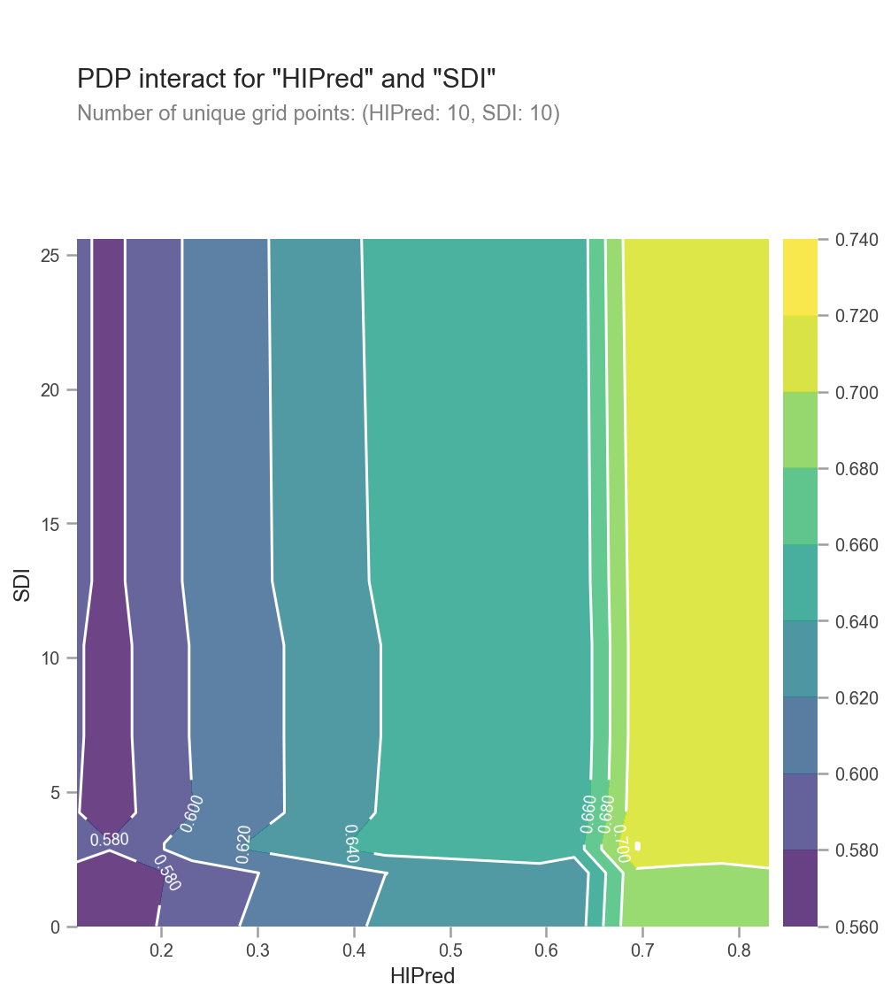

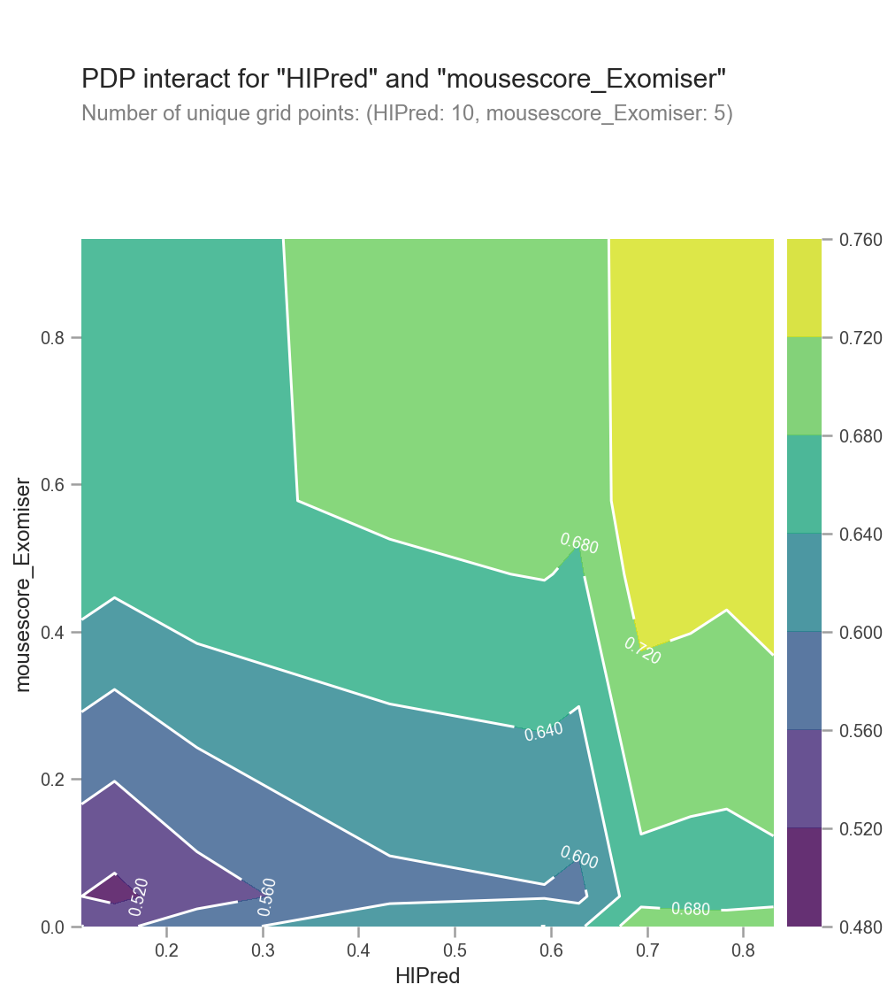

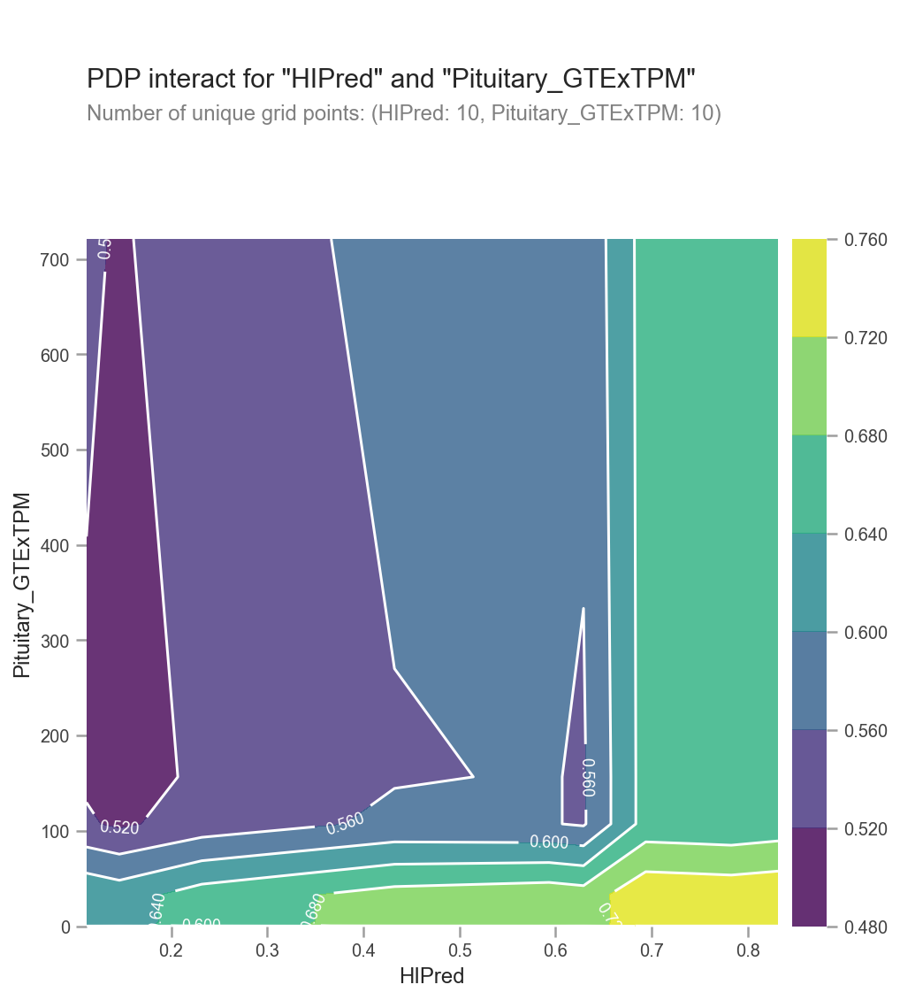

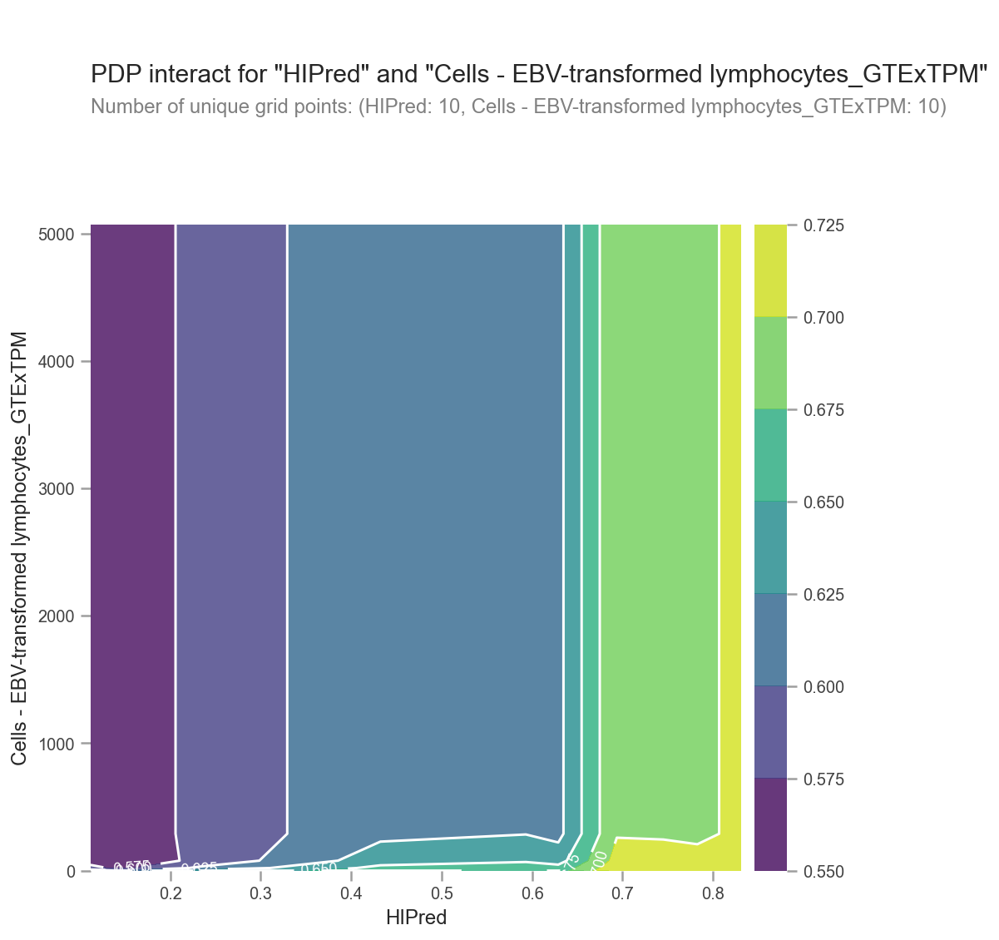

In [41]:
features_to_plot = ["HIPred", "pLI_ExAC"]
inter1 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)


pdp.pdp_interact_plot(
    pdp_interact_out=inter1, feature_names=features_to_plot, plot_type="contour"
)
plt.show()

features_to_plot = ["HIPred", "Liver_GTExTPM"]
inter2 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter2, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ["HIPred", "IPA_BP_annotation"]
inter3 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter3, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ["HIPred", "SDI"]
inter4 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter4, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ["HIPred", "mousescore_Exomiser"]
inter4 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter4, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ["HIPred", "Pituitary_GTExTPM"]
inter4 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter4, feature_names=features_to_plot, plot_type="contour"
)
plt.show()

features_to_plot = ["HIPred", "Cells - EBV-transformed lymphocytes_GTExTPM"]
inter4 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter4, feature_names=features_to_plot, plot_type="contour"
)
plt.show()

### Clustering to view training data grouping:

#### PCA Explained Variance 
- for deciding n components in hierarchal clustering

In [42]:
mean_vec = np.mean(X2, axis=0)
cov_mat = (X2 - mean_vec).T.dot((X2 - mean_vec)) / (X2.shape[0] - 1)

In [43]:
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print("Eigenvectors \n%s" % eig_vecs)
print("\nEigenvalues \n%s" % eig_vals)


# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:, i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print("Eigenvalues in descending order:")
for i in eig_pairs:
    print(i[0])

Eigenvectors 
[[ 2.35990351e-03 -6.06972695e-03 -5.52155090e-03  9.99529096e-01
   1.29549882e-02 -2.43314291e-02  6.91443726e-03 -7.81207874e-03]
 [ 9.03891029e-02 -9.90915023e-01  9.94226357e-02 -5.67735941e-03
   2.16598895e-04  2.89236043e-04 -4.56636064e-05 -3.93122729e-05]
 [ 9.86170847e-01  1.02989651e-01  1.29842989e-01 -9.81851927e-04
  -1.44854783e-04  6.23159791e-05 -4.25013722e-05  1.76700059e-05]
 [ 1.38893083e-01 -8.62763219e-02 -9.86521594e-01 -6.31428251e-03
  -8.82350894e-05 -5.60748740e-04  1.98293241e-04  1.45917150e-04]
 [ 3.59447273e-05  6.37388299e-05 -5.71927131e-04  1.96389392e-02
  -9.57938496e-02  9.06421158e-01  3.92540067e-01 -1.21451628e-01]
 [-5.64474814e-05 -1.84452942e-04  1.76348137e-04  9.73739218e-03
  -3.97788179e-01 -2.76809176e-02  2.40174503e-01  8.84996980e-01]
 [-6.74315637e-08 -3.75327023e-05 -4.81309340e-04  1.90085517e-02
  -1.33127926e-01  3.95816307e-01 -8.87642273e-01  1.93225371e-01]
 [-9.52090887e-05 -2.52941243e-04  7.41788539e-05  5.16

In [44]:
tot = sum(eig_vals)
var_exp = [(i / tot) * 100 for i in sorted(eig_vals, reverse=True)]
len(var_exp)

8

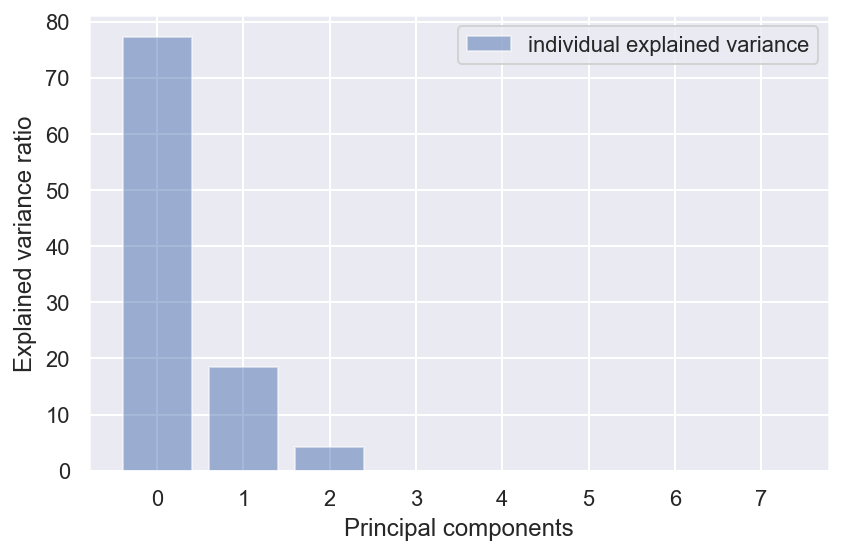

In [45]:
sns.set(font_scale=1)
plt.figure(figsize=(6, 4))

plt.bar(
    range(8), var_exp, alpha=0.5, align="center", label="individual explained variance"
)
plt.ylabel("Explained variance ratio")
plt.xlabel("Principal components")
plt.legend(loc="best")
plt.tight_layout()

Text(0, 0.5, 'Cumulative explained variance')

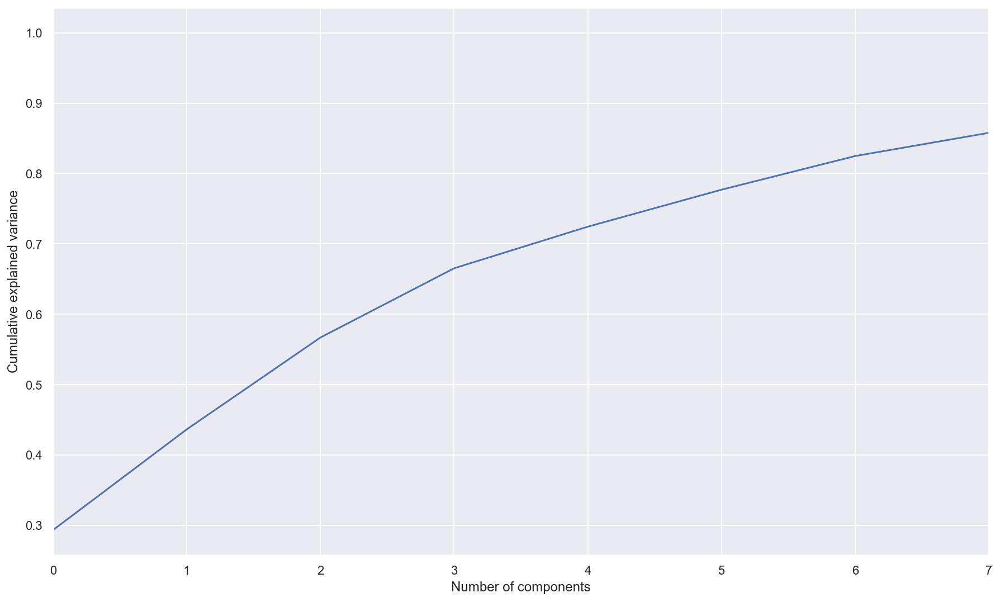

In [46]:
from sklearn.decomposition import PCA

pca = PCA().fit(X)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0, 7, 1)
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")

## Hierarchal Clustering

### All training data:

In [47]:
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop("max_d", None)
    if max_d and "color_threshold" not in kwargs:
        kwargs["color_threshold"] = max_d
    annotate_above = kwargs.pop("annotate_above", 0)
    plt.figure(figsize=(15, 10))
    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get("no_plot", False):
        plt.title("Hierarchical Clustering Dendrogram (truncated)")
        plt.xlabel("sample index or (cluster size)")
        plt.ylabel("distance")
        for i, d, c in zip(ddata["icoord"], ddata["dcoord"], ddata["color_list"]):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, "o", c=c)
                plt.annotate(
                    "%.3g" % y,
                    (x, y),
                    xytext=(0, -5),
                    textcoords="offset points",
                    va="top",
                    ha="center",
                )
        if max_d:
            plt.axhline(y=max_d, c="k")
    return ddata

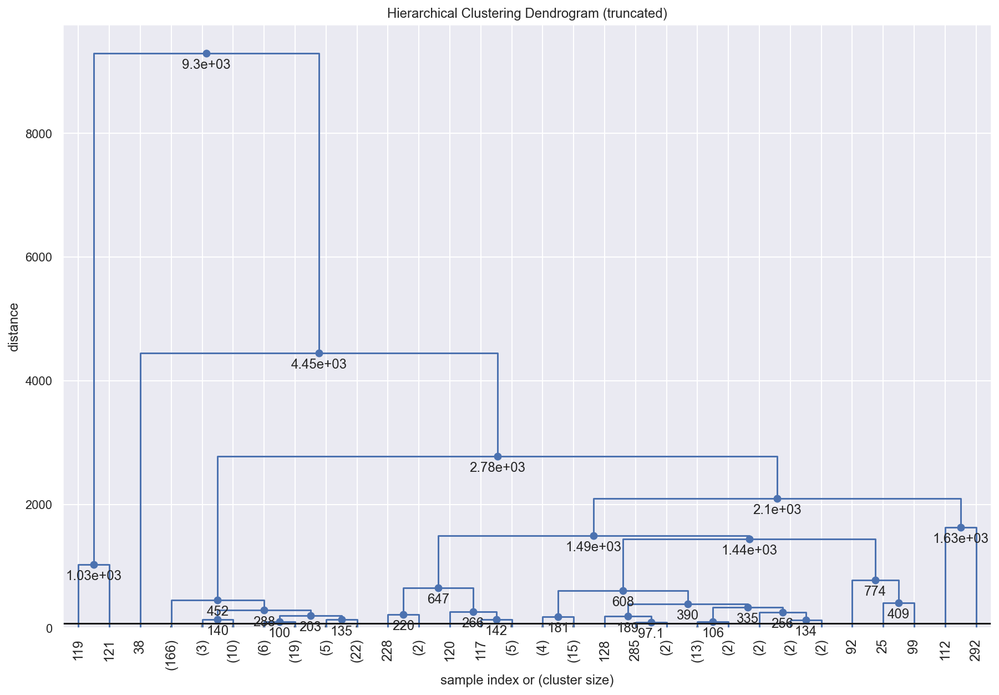

In [48]:
linked_array = ward(X2)

fancy_dendrogram(
    linked_array,
    truncate_mode="lastp",
    p=30,
    leaf_rotation=90.0,
    leaf_font_size=12.0,
    show_contracted=True,
    annotate_above=10,
    max_d=80,
)

plt.show()

In [49]:
# Reducing the dimensions of the data
pca = PCA(n_components=2)
X_principal = pca.fit_transform(X)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ["P1", "P2"]

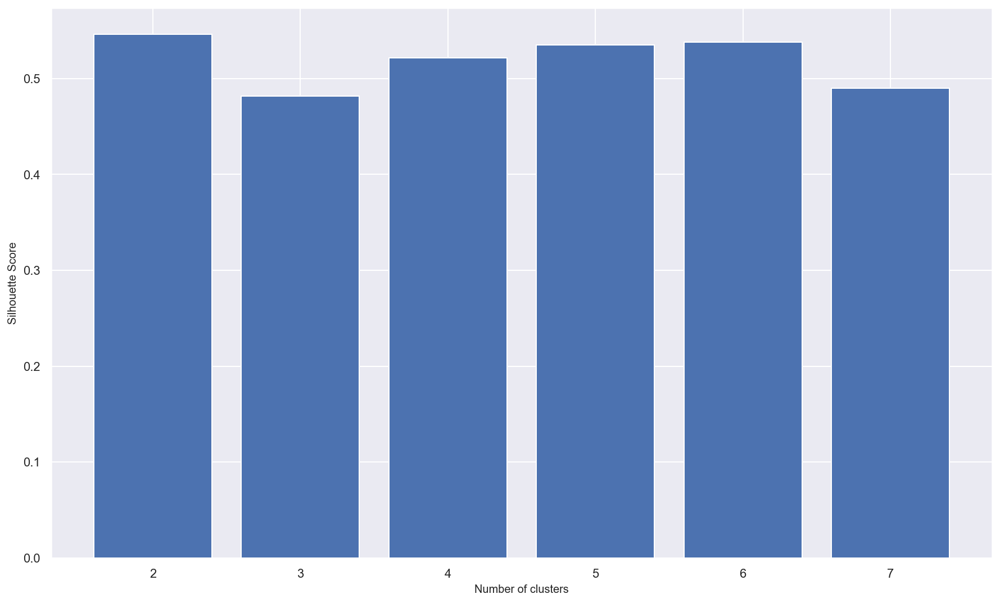

In [50]:
silhouette_scores = []

for n_cluster in range(2, 8):
    silhouette_scores.append(
        silhouette_score(
            X_principal,
            AgglomerativeClustering(n_clusters=n_cluster).fit_predict(X_principal),
        )
    )

# Plotting a bar graph to compare the results
k = [2, 3, 4, 5, 6, 7]
plt.bar(k, silhouette_scores)
plt.xlabel("Number of clusters", fontsize=10)
plt.ylabel("Silhouette Score", fontsize=10)
plt.show()

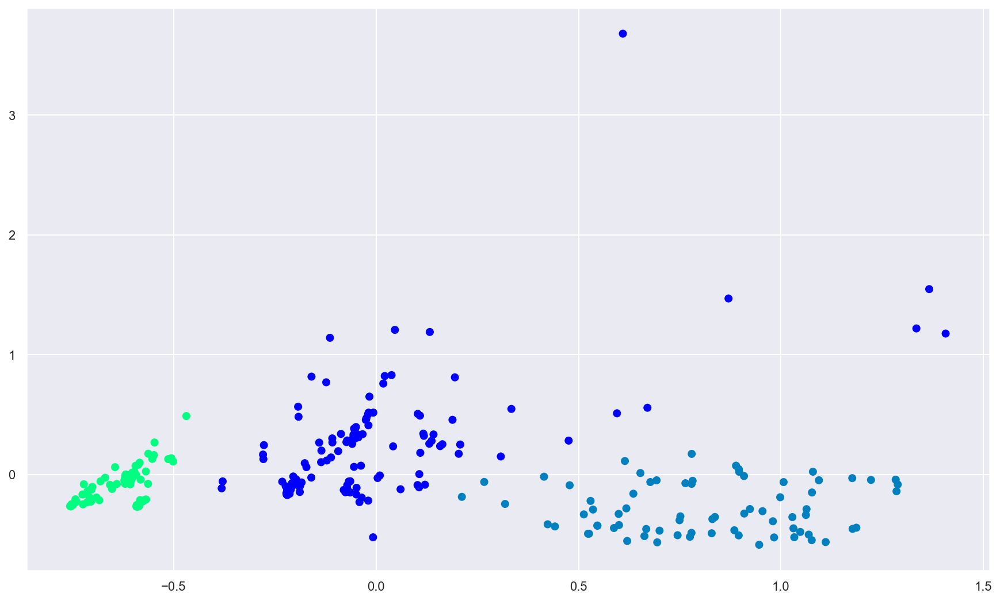

In [51]:
agg = AgglomerativeClustering(n_clusters=3)
agg.fit(X_principal)

sns.set(font_scale=1)
plt.scatter(
    X_principal["P1"],
    X_principal["P2"],
    c=AgglomerativeClustering(n_clusters=3).fit_predict(X_principal),
    cmap=plt.cm.winter,
)
plt.show()

### Elbow and silhouette scores - no PCA

Text(0, 0.5, 'Total within-cluster sum of squares')

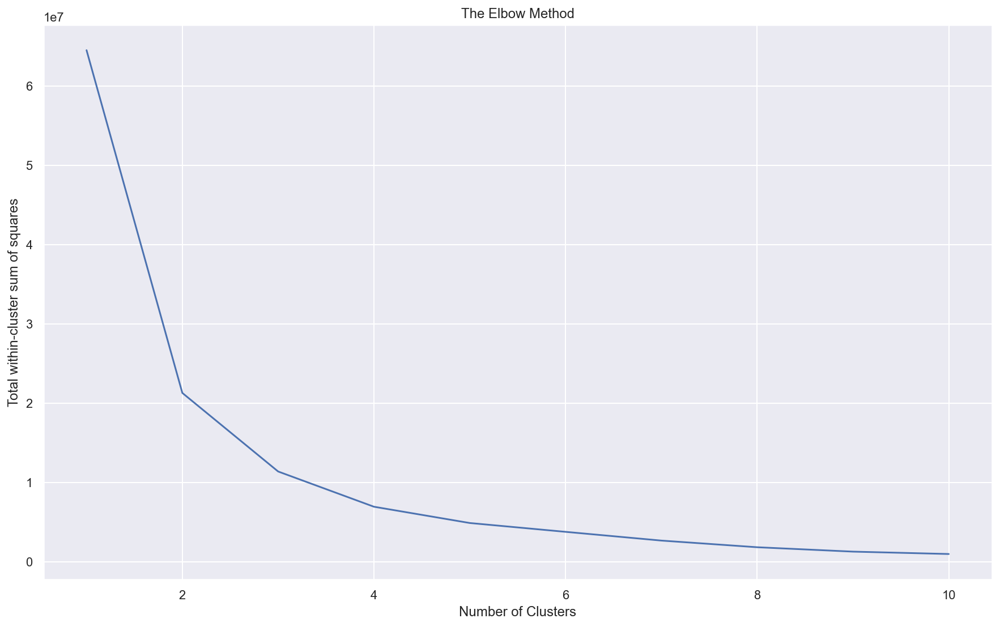

In [52]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

twss = []
sa = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init="k-means++")
    kmeans.fit(X2)
    Ypreds = kmeans.predict(X2)
    twss.append(kmeans.inertia_)
    if i > 1:
        sa.append(silhouette_score(X2, Ypreds))


plt.plot(range(1, 11), twss)
plt.title("The Elbow Method")
plt.xlabel("Number of Clusters")
plt.ylabel("Total within-cluster sum of squares")

Text(0, 0.5, 'Average silhouette score')

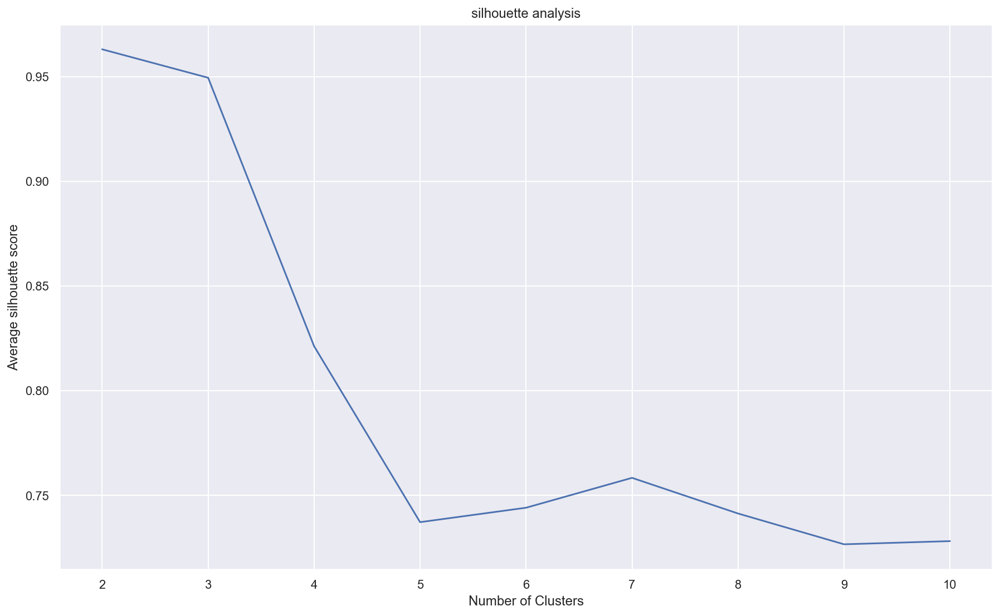

In [53]:
plt.plot(range(2, 11), sa)
plt.title("silhouette analysis")
plt.xlabel("Number of Clusters")
plt.ylabel("Average silhouette score")